<a href="https://colab.research.google.com/github/ABHIRAM199/my_practice/blob/main/SVD%2C_t_SNE%2C_and_Recommendation_Systems.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SVD, t-SNE, and Recommendation Systems

**Agenda**
* Singular Valued Decomposition (SVD)
  * Mathematics behind SVD
  * Applications of SVD
  * Implementation of SVD
* t-SNE (t-distributed Stochastic Neighbor Embedding)
  * What is t-SNE?
  * t-SNE vs PCA
  * What is Dimensionality Reduction?
  * Working of t-SNE
  * Implementation of t-SNE
  * Advantages and Disadvantages
* Introduction to Recommendation System
  * Types of Recommendation Systems
    * Content-Based Filtering
      * TF-IDF Vectorizer
      * Advantages and Disadvantages
    * Collaborative Based Filtering
      * User-Based Collaborative Filtering
      * Item-Based Collaborative Filtering
      * User-Item Matrix
      * Advantages and Disadvantages
  * Implementation of Recommendation System
  * Implementation of Item-Based Collaborative Filtering - Another Example
* Case Study - Music Recommendation System using Spotify Dataset
  * Checking for null, duplicates, etc.
  * Data Visualization
  * Clustering Genres with K-Means
  * Clustering Songs with K-Means
  * Building the Recommendation System

## Singular Valued Decomposition (SVD)

Singular Value Decomposition (SVD) is a mathematical technique used in linear algebra to factorize a matrix into three other matrices. It is a powerful tool for analyzing and manipulating matrices and has a wide range of applications in data science, machine learning, and other fields.

The SVD of a matrix is a factorization of that matrix into three matrices. It has some interesting algebraic properties and conveys important geometrical and theoretical insights about linear transformations. It also has some important applications in data science.

### Mathematics behind SVD

The SVD of  mxn matrix A is given by the formula  $A = U\Sigma V^T$  

where:

* U:  $mxm$ matrix of the orthonormal eigenvectors of $AA^{T}$.
* $V^T$: transpose of a $nxn$ matrix containing the orthonormal eigenvectors of $A^TA$.
* $\Sigma$: diagonal matrix with r elements equal to the root of the positive eigenvalues of AAᵀ or AᵀA (both matrics have the same positive eigenvalues anyway).

**Example**

* Find the SVD for the matrix
  $A = \begin{bmatrix} 3&2 & 2 \\ 2&  3& -2 \end{bmatrix}$
* To calculate the SVD, First, we need to compute the singular values by finding eigen values of $AA^{T}$.

  $A \cdot A^{T} =\begin{bmatrix} 3& 2 & 2 \\ 2&  3& -2 \end{bmatrix} \cdot \begin{bmatrix} 3 & 2 \\ 2 & 3 \\ 2 & -2 \end{bmatrix} = \begin{bmatrix} 17 & 8\\ 8 & 17 \end{bmatrix}$

* The characteristic equation for the above matrix is:

  $W - \lambda I =0 \\ A A^{T} - \lambda I =0$   
  $\lambda^{2} - 34 \lambda + 225 =0$  
  $= (\lambda-25)(\lambda -9)4$

  So, our singular values are: $\sigma_1 = 5 \,$ ; $\sigma_2 = 3$

* Now we find the right singular vectors i.e orthonormal set of eigenvectors of $A^TA$. The eigenvalues of $A^TA$ are 25, 9, and 0, and since $A^TA$ is symmetric we know that the eigenvectors will be orthogonal.

  For $\lambda =25$,  

  $A^{T}A - 25 \cdot I  = \begin{bmatrix} -12 &  12& 2\\ 12 &  -12 & -2\\ 2&  -2 & -17 \end{bmatrix}$  

  which can be row-reduces to :

  $\begin{bmatrix} 1&  -1& 0 \\ 0&  0&  1\\ 0&  0& 0 \end{bmatrix}$  

  A unit vector in the direction of it is:

  $v_1 = \begin{bmatrix} \frac{1}{\sqrt{2}}\\ \frac{1}{\sqrt{2}}\\ 0 \end{bmatrix}$  

  Similarly, for $\lambda = 9$, the eigenvector is:

  $v_2 =\begin{bmatrix} \frac{1}{\sqrt{18}}\\ \frac{-1}{\sqrt{18}}\\ \frac{4}{\sqrt{18}}\\ \end{bmatrix}$  

  For the 3rd eigenvector, we could use the property that it is perpendicular to $v_1$ and $v_2$ such that:

  $v_1^{T} v_3 =0 \\ v_2^{T} v_3 =0$  

  Solving the above equation to generate the third eigenvector

  $v_3 = \begin{bmatrix} a\\ b\\ c \end{bmatrix} = \begin{bmatrix} a\\ -a \\ -a/2 \end{bmatrix} = \begin{bmatrix} \frac{2}{3}\\ \frac{-2}{3}\\ \frac{-1}{3} \end{bmatrix}$  

  Now, we calculate U using the formula $u_i = \frac{1}{\sigma} A v_i$ and this gives $U =\begin{bmatrix} \frac{1}{\sqrt{2}} &\frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}}& \frac{-1}{\sqrt{2}} \end{bmatrix}$
  
  Hence, our final SVD equation becomes:

  $A = \begin{bmatrix} \frac{1}{\sqrt{2}} &\frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}}& \frac{-1}{\sqrt{2}} \end{bmatrix} \begin{bmatrix} 5 &  0& 0 \\ 0 &  3& 0 \end{bmatrix} \begin{bmatrix} \frac{1}{\sqrt{2}}& \frac{1}{\sqrt{2}} &0 \\ \frac{1}{\sqrt{18}}& \frac{-1}{\sqrt{18}} & \frac{4}{\sqrt{18}}\\ \frac{2}{3}&\frac{-2}{3}  &\frac{1}{3} \end{bmatrix}$

### Applications of SVD

* **Recommender Systems**: SVD is used in collaborative filtering techniques for building recommendation engines. It decomposes the user-item interaction matrix to predict user preferences and make recommendations. For instance, the famous Netflix recommendation system uses SVD.

* **Dimensionality Reduction**: SVD is used to reduce the number of features in a dataset while preserving as much variance as possible. This is particularly useful in tasks like Principal Component Analysis (PCA), where SVD helps identify the principal components.

* **Data Compression**: In image processing, SVD is used for compressing images. By keeping only the most significant singular values and corresponding vectors, the storage space required for the image can be significantly reduced while maintaining its quality.

* **Noise Reduction**: SVD can be used to separate signal from noise in data. By reconstructing the data using only the largest singular values, noise can be effectively reduced, which is useful in signal processing and data cleaning.

* **Latent Semantic Analysis (LSA)**: In natural language processing (NLP), SVD is used for topic modeling and uncovering the latent structure in text data. LSA uses SVD to reduce the dimensionality of term-document matrices, which helps in identifying patterns and relationships between terms.

* **Matrix Completion**: SVD is used in algorithms for matrix completion problems, such as the famous Netflix prize problem. The goal is to fill in missing entries of a partially observed matrix, often encountered in collaborative filtering for recommendation systems.

* **Image Recognition and Face Recognition**: In computer vision, SVD is applied in techniques like Eigenfaces for face recognition. It helps in decomposing face images into a set of characteristic feature vectors.

* **Solving Linear Systems and Pseudo-Inverse Calculation**: SVD is used to solve linear systems of equations, especially when the matrix is not square or is ill-conditioned. The pseudo-inverse of a matrix, which is useful for finding least-squares solutions, is computed using SVD.

### Implementation of SVD

**Example 1**

In [ ]:
import numpy as np
from sklearn.decomposition import TruncatedSVD

# Create a sample matrix (e.g., user-item rating matrix)
A = np.array([[5, 4, 0, 0],
              [4, 0, 0, 2],
              [0, 0, 3, 0],
              [0, 2, 4, 5]])

# Perform SVD
U, Sigma, VT = np.linalg.svd(A, full_matrices=False)

# Reduce the dimensionality (keep only the top k singular values)
k = 2  # Number of singular values to keep
U_reduced = U[:, :k]
Sigma_reduced = np.diag(Sigma[:k])
VT_reduced = VT[:k, :]

# Reconstruct the approximated matrix
A_approx = np.dot(U_reduced, np.dot(Sigma_reduced, VT_reduced))

print("Original Matrix:\n", A)
print("Approximated Matrix:\n", A_approx)

Original Matrix:
 [[5 4 0 0]
 [4 0 0 2]
 [0 0 3 0]
 [0 2 4 5]]
Approximated Matrix:
 [[ 5.45640906  2.94989656 -0.35969841  0.69134583]
 [ 3.12723602  1.89303695  0.38165574  1.00943218]
 [-0.42128592  0.25683359  1.43540286  1.41505544]
 [ 0.24799716  1.6694357   4.4435186   4.68393454]]


In [ ]:
A.shape

(4, 4)

In [ ]:
A_approx.shape

(4, 4)

While the code manipulates the internal components to reduce dimensionality, the final approximated matrix, $A_{approx}$, actually retains the same dimensions (4x4) as the original matrix $A$.

**Here's why this happens:**

Truncated SVD aims to capture the most important information from the data using a smaller set of features (represented by the top singular values).
During reconstruction, the reduced components ($U_{reduced}$, $\Sigma_{reduced}$, and $V^T_{reduced}$) have lower dimensions compared to the original ones. However, when they are multiplied together, the resulting $A_{approx}$ ends up having the same dimensions as the original data.

**Think of it like this:**

Imagine you have a complex image with many details. Truncated SVD would identify the most crucial features (like shapes, colors) and discard less important ones (fine textures, noise). To represent the image in a lower-dimensional space, you wouldn't physically remove parts of the image. Instead, you'd use a more efficient encoding that captures the essence with fewer elements.

While $A_{approx}$ has the same size, it contains a lower-rank approximation of the original data. It retains the most significant patterns and relationships from $A$, but with less information. This can be beneficial for various tasks:

* **Visualization**: Projecting high-dimensional data onto a lower-dimensional space allows for easier visualization in techniques like PCA (Principal Component Analysis).
* **Data compression**: By discarding less important information, truncated SVD can compress data while preserving the core structure.
* **Machine learning efficiency**: Many machine learning algorithms struggle with high dimensionality. Truncated SVD can pre-process data by reducing dimensions, leading to faster training times and potentially better performance.

**Example 2**

The following code showcases how SVD can be used for image compression. By keeping only the most significant singular values, the code creates compressed versions of the image that capture the essential details while discarding less important information. This allows for a trade-off between image quality and file size.

For this, we'll load an image of a cat using ```skimage.data.chelsea```

[[ 3  3  2]
 [ 2  3 -2]]
U:  [[-0.7815437 -0.6238505]
 [-0.6238505  0.7815437]]
Singular array [5.54801894 2.86696457]
V^{T} [[-0.64749817 -0.7599438  -0.05684667]
 [-0.10759258  0.16501062 -0.9804057 ]
 [-0.75443354  0.62869461  0.18860838]]
[[ 0.11462451  0.04347826]
 [ 0.07114625  0.13043478]
 [ 0.22134387 -0.26086957]]


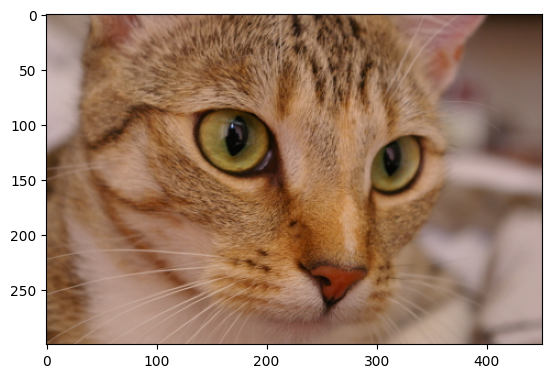

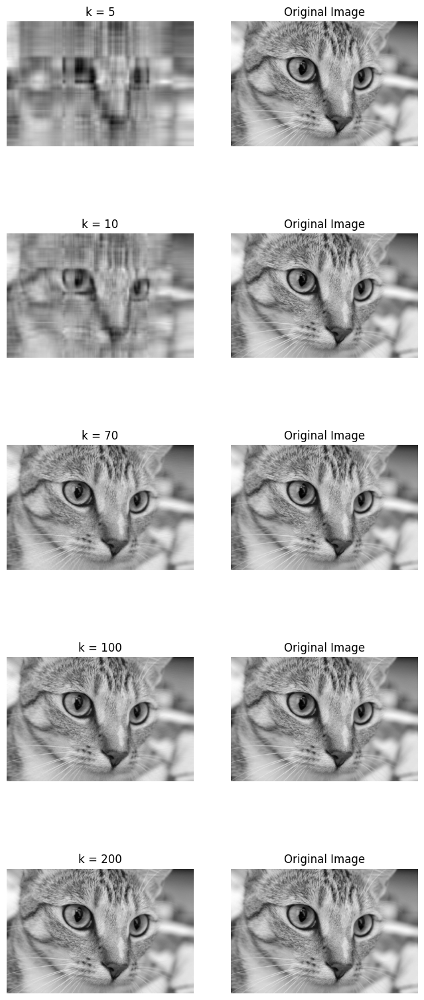

In [ ]:
# Imports

from skimage.color import rgb2gray
from skimage import data
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import svd

"""
Singular Value Decomposition
"""
# define a matrix
X = np.array([[3, 3, 2], [2, 3, -2]])
print(X)
# perform SVD
U, singular, V_transpose = svd(X)
# print different components
print("U: ", U)
print("Singular array", singular)
print("V^{T}", V_transpose)

"""
Calculate Pseudo inverse
"""
# inverse of singular matrix is just the reciprocal of each element
singular_inv = 1.0 / singular
# create m x n matrix of zeroes and put singular values in it
s_inv = np.zeros(X.shape)
s_inv[0][0] = singular_inv[0]
s_inv[1][1] = singular_inv[1]
# calculate pseudoinverse
M = np.dot(np.dot(V_transpose.T, s_inv.T), U.T)
print(M)

"""
SVD on image compression
"""


cat = data.chelsea()
plt.imshow(cat)
# convert to grayscale
gray_cat = rgb2gray(cat)

# calculate the SVD and plot the image
U, S, V_T = svd(gray_cat, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70, 100, 200]:
	cat_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
	ax[curr_fig][0].imshow(cat_approx, cmap='gray')
	ax[curr_fig][0].set_title("k = "+str(r))
	ax[curr_fig, 0].axis('off')
	ax[curr_fig][1].set_title("Original Image")
	ax[curr_fig][1].imshow(gray_cat, cmap='gray')
	ax[curr_fig, 1].axis('off')
	curr_fig += 1
plt.show()

**What is being done in the above code?**

* Singular Value Decomposition (SVD):

  * It defines a sample matrix ```X```.
  * It performs SVD on ```X``` using ```scipy.linalg.svd``` and stores the results in ```U``` (left singular vectors), ```singular``` (singular values), and ```V_transpose``` (transposed right singular vectors).
  * It then prints all three components.
* Calculating Pseudoinverse:

  * It calculates the reciprocal of each element in the singular value array (```singular```) to get the inverse singular values (```singular_inv```).
  * It creates a zero matrix (```s_inv```) with the same dimensions as ```X``` and then puts the corresponding inverse singular values on the diagonal.
  * Finally, it calculates the pseudoinverse of ```X``` using matrix multiplication involving ```V_transpose.T```, ```s_inv.T```, and ```U.T```.
  * The pseudoinverse is useful for solving systems of linear equations that may not have a unique solution.
* SVD for Image Compression:

  * It loads an image of a cat using ```skimage.data.chelsea```.
  * It converts the image to grayscale using ```skimage.color.rgb2gray```.
  * It performs SVD on the grayscale image using svd with ```full_matrices=False``` to compute only the most important components.
  * It then creates a diagonal matrix ```S``` from the singular values.
  * The code uses a ```matplotlib``` subplot to display the original image and reconstructions with different numbers of singular values (```k```).
  * For each value of ```k``` (5, 10, 70, 100, 200):
    * It selects the first ```k``` columns from ```U``` and ```V_T```, and the first ```k``` diagonal elements from ```S```.
    * It multiplies these reduced components to get an approximation (```cat_approx```) of the original image.
    * The approximation and the original image are displayed side-by-side in the subplot.

## t-SNE (t-distributed Stochastic Neighbor Embedding)

### What is t-SNE?

t-SNE (t-distributed Stochastic Neighbor Embedding) is an unsupervised non-linear dimensionality reduction technique for data exploration and visualizing high-dimensional data. Non-linear dimensionality reduction means that the algorithm allows us to separate data that cannot be separated by a straight line.

<img src="https://images.datacamp.com/image/upload/v1680172282/image2_b5cf5fcd12.gif" alt="Description" width="500"/>

t-SNE gives you a feel and intuition on how data is arranged in higher dimensions. It is often used to visualize complex datasets into two and three dimensions, allowing us to understand more about underlying patterns and relationships in the data.

### t-SNE vs PCA

* Both t-SNE and PCA are dimensional reduction techniques that have different mechanisms and work best with different types of data.

* PCA (Principal Component Analysis) is a linear technique that works best with data that has a linear structure. It seeks to identify the underlying principal components in the data by projecting onto lower dimensions, minimizing variance, and preserving large pairwise distances.

* But, t-SNE is a nonlinear technique that focuses on preserving the pairwise similarities between data points in a lower-dimensional space. t-SNE is concerned with preserving small pairwise distances whereas, PCA focuses on maintaining large pairwise distances to maximize variance.

* In summary, PCA preserves the variance in the data, whereas t-SNE preserves the relationships between data points in a lower-dimensional space, making it quite a good algorithm for visualizing complex high-dimensional data.

* PCA is a deterministic algorithm to reduce the dimensionality of the algorithm and the t-SNE algorithm a randomized non-linear method to map the high dimensional data to the lower dimensional. The data that is obtained after reducing the dimensionality via the t-SNE algorithm is generally used for visualization purpose only.

* One more thing that we can say is an advantage of using the t-SNE data is that it is not effected by the outliers but the PCA algorithm is highly affected by the outliers because the methodologies that are used in the two algorithms is different. While we try to preserve the variance in the data using PCA algorithm we use t-SNE algorithm to retain the local structure of the dataset.

### What is Dimensionality Reduction?

In order to understand how t-SNE works and t-SNE visualization, let’s first understand what is dimensionality reduction.

* Well, in simple terms, dimensionality reduction is the technique of representing multi-dimensional data (data with multiple features having a correlation with each other) in 2 or 3 dimensions.

* Some of you might question why do we need Dimensionality Reduction when we can plot the data using scatter plots, histograms & boxplots and make sense of the pattern in data using descriptive statistics.

* Well, even if you can understand the patterns in data and present it on simple charts, it is still difficult for anyone without statistics background to make sense of it. Also, if you have hundreds of features, you have to study thousands of charts before you can make sense of this data.

* With the help of dimensionality reduction algorithm, you will be able to present the data explicitly.

### Working of t-SNE

Here’s how t-SNE operates:

* **Measure Similarity**: Initially, it assesses the similarity between each pair of data points within the high-dimensional space.
* **Map to Lower Dimensions**: Subsequently, it endeavors to represent these similarities in a simplified space while preserving the relationships between the points as faithfully as possible.
* **Adjust Positions**: It iteratively adjusts the positions of points in the simplified space to align the similarities as closely as feasible.
* **Visualize**: Finally, it plots these points in the simplified space, often on a graph, facilitating easier pattern recognition and analysis.

To utilize t-SNE, one must prepare the data point, execute the t-SNE algorithm (accessible in libraries like scikit-learn or TensorFlow), and then visualize the outcomes. It serves as a valuable tool for comprehending intricate datasets.

It’s quite simple actually, t-SNE a non-linear dimensionality reduction algorithm finds patterns in the data by identifying observed clusters based on similarity of data points with multiple features. But it is not a clustering algorithm it is a dimensionality reduction algorithm. This is because it maps the multi-dimensional data to a lower dimensional space, the input features are no longer identifiable. Thus you cannot make any inference based only on the output of t-SNE. So essentially it is mainly a data exploration and visualization technique.

But t-SNE can be used in the process of classification and clustering by using its output as the input feature for other classification algorithms.

### Implementation of t-SNE

We will use the MNIST dataset for implementing t-SNE. The MNIST dataset is a classic benchmark dataset in the field of machine learning and computer vision. It consists of a large collection of handwritten digits, commonly used for training various image processing systems. Each image in the dataset is a grayscale, 28x28 pixel image representing a single digit from 0 to 9.

**Dataset Description**:

* The MNIST dataset contains 70,000 labeled images of handwritten digits.
* Each image is represented as a 28x28 pixel grid, resulting in a feature vector of 784 dimensions (28 * 28).

**Objective**

Our goal is to visualize the high-dimensional MNIST dataset in a lower-dimensional space while preserving the inherent structure and relationships between the digits.

**Implementation of t-SNE:**
* We preprocess the MNIST dataset by standardizing the features to have a mean of 0 and a variance of 1. This step is essential for t-SNE to work effectively.
* Next, we apply t-SNE to reduce the dimensionality of the dataset from 784 dimensions to 2 dimensions, allowing us to visualize the data in a 2D space.
* t-SNE preserves the local structure of the data, meaning that similar digits will be close together in the reduced-dimensional space, while dissimilar digits will be farther apart.

**Visualization**:

* We visualize the t-SNE results by creating a scatter plot, where each point represents a digit from the MNIST dataset.
* Points belonging to the same digit cluster together, forming distinct clusters for each digit class.
* This visualization helps us understand the distribution and separability of the digits in the reduced-dimensional space.

By applying t-SNE to the MNIST dataset, we can gain insights into the structure of the handwritten digits and observe how different digits are distributed in a lower-dimensional space. This visualization can be useful for exploratory data analysis, feature engineering, and understanding the performance of machine learning models on the dataset.

In [ ]:
# Step 1: Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import StandardScaler

In [ ]:
# Step 2: Load the MNIST dataset
mnist = fetch_openml('mnist_784', version=1)
X, y = mnist.data, mnist.target

In [ ]:
# Step 3: Preprocess the data
# Standardize the data to have mean 0 and variance 1 (z-score normalization)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# Step 4: Perform t-SNE
# Initialize t-SNE with specific parameters
tsne = TSNE(n_components=2, random_state=42)

In [ ]:
# Reduce dimensionality
X_tsne = tsne.fit_transform(X_scaled[:10000])  # Using a subset of data for faster computation
y_subset = y[:10000]

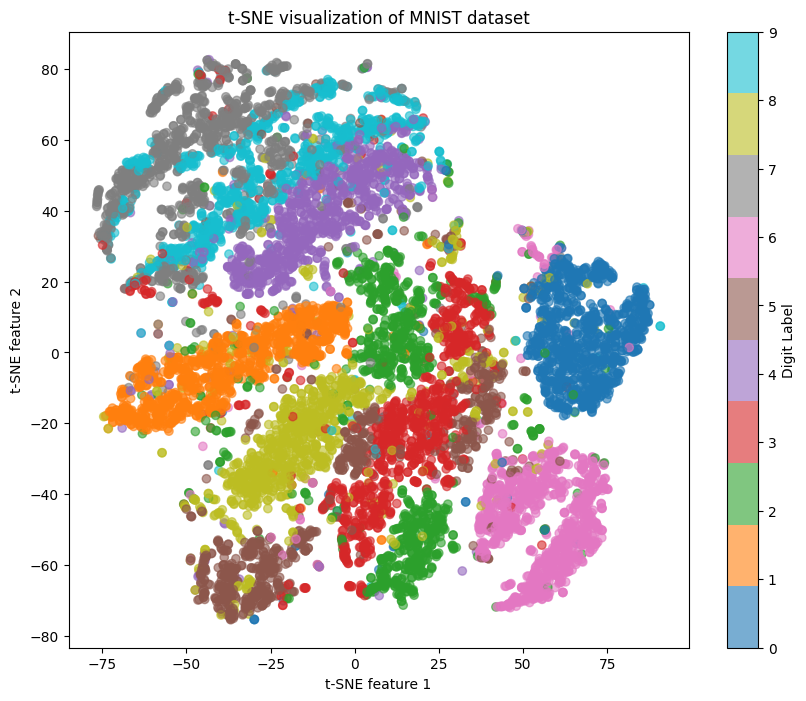

In [ ]:
# Step 5: Visualize the results
# Create a scatter plot of the t-SNE results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_subset.astype(int), cmap='tab10', alpha=0.6)
plt.colorbar(scatter, label='Digit Label')
plt.title('t-SNE visualization of MNIST dataset')
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')
plt.show()

### Advantages and Disadvantages

**Advantages**:

1. **Preservation of Local Structure**: t-SNE is particularly effective at preserving the local structure of the data. It aims to map similar data points in the high-dimensional space to nearby points in the low-dimensional space, making it useful for visualizing clusters and identifying local patterns.

2. **Non-linear Embedding**: Unlike PCA (Principal Component Analysis), which assumes linear relationships between variables, t-SNE is capable of capturing non-linear relationships. This makes it suitable for datasets with complex, non-linear structures.

3. **Robustness to Noise**: t-SNE is robust to noisy data and outliers. It can effectively filter out noise during the dimensionality reduction process, leading to more meaningful visualizations.

4. **Flexibility in Parameter Tuning**: t-SNE offers several parameters that can be tuned to optimize the visualization for specific datasets. Parameters such as perplexity, learning rate, and number of iterations allow users to tailor the visualization to their needs.

5. **Global and Local Structure Visualization**: While t-SNE primarily focuses on preserving local structure, it also provides insights into the global structure of the data. This allows users to identify both local clusters and global relationships within the dataset.

**Disadvantages**:

1. **Computational Complexity**: t-SNE can be computationally expensive, especially for large datasets. The algorithm's time complexity is \(O(N^2)\), where \(N\) is the number of data points. Additionally, finding the optimal parameters for t-SNE can require significant computational resources.

2. **Non-Deterministic Behavior**: t-SNE is non-deterministic, meaning that running the algorithm multiple times on the same dataset may produce different results. While this variability can be advantageous for exploring different embeddings, it can also make reproducibility challenging.

3. **Overcrowding of Clusters**: In some cases, t-SNE may suffer from overcrowding of clusters in the low-dimensional space. This occurs when clusters overlap or when the intrinsic dimensionality of the data is not well captured by the chosen parameters.

4. **Curse of Dimensionality**: Although t-SNE reduces the dimensionality of the data, it does not address the fundamental issue of the curse of dimensionality. High-dimensional datasets may still pose challenges related to sparsity, distance calculations, and model complexity.

5. **Interpretability**: While t-SNE produces visually appealing embeddings, interpreting the results can be subjective and challenging. The low-dimensional representation may not always capture the full complexity of the original data, leading to potential misinterpretations.

## Introduction to Recommendation System

 * Recommendation Systems employ a data-driven methodology to offer customers tailored recommendations. It uses user data and algorithms to forecast and suggest goods, services, or content that a user is probably going to find interesting.
 * These systems are essential in applications where users may become overwhelmed by large volumes of information, such as social media, streaming services, and e-commerce.
 * Building recommendation systems is a common use for Python because of its modules and machine learning frameworks.
 * The two main kinds are **content-based filtering** (which takes into account the characteristics of products and user profiles) and **collaborative filtering** (which generates recommendations based on user behaviour and preferences).
 * Hybrid strategies that integrate the two approaches are also popular. These kinds of systems improve user experiences, boost user involvement, and propel corporate expansion.

Recommendation System is of different types:

* **Content-Based Filtering**: It is supervised machine learning used to induce a classifier to discriminate between interesting and uninteresting items for the user.
* **Collaborative Filtering**: Collaborative Filtering recommends items based on similarity measures between users and/or items. The basic assumption behind the algorithm is that users with similar interests have common preferences.

## Types of Recommendation Systems

### Content-Based Filtering

* In this type of recommendation system, relevant items are shown using the content of the previously searched items by the users. Here content refers to the attribute/tag of the product that the user like.
* In this type of system, products are tagged using certain keywords, then the system tries to understand what the user wants and it looks in its database and finally tries to recommend different products that the user wants.

For Example - In a movie recommendation system, each film is tagged with genres. When a new user, User A, joins, the system initially suggests popular movies or gathers information through a user form. As User A rates movies over time, preferences emerge; for instance, if User A consistently rates action movies highly but rates anime movies poorly, the system recommends more action-oriented content. However, this doesn’t imply a dislike for anime movies; further data collection is needed to refine recommendations accurately.

In a content-based recommendation system, first, we need to create a profile for each item, which represents the properties of those items. The user profiles are inferred for a particular user. We use these user profiles to recommend the items to the users from the catalog.

**Item Profile**

In a content-based recommendation system, we need to build a profile for each item, which contains the important properties of each item. For Example, If the movie is an item, then its actors, director, release year, and genre are its important properties, and for the document, the important property is the type of content and set of important words in it.

Let’s have a look at how to create an item profile. First, we need to perform the TF-IDF vectorizer, here TF (term frequency) of a word is the number of times it appears in a document and The IDF (inverse document frequency) of a word is the measure of how significant that term is in the whole corpus.

#### TF-IDF Vectorizer

* **Term Frequency(TF)** : Term frequency, or **TF** for short, is a key idea in information retrieval and natural language processing. It displays the regularity with which a certain term or word occurs in a text corpus or document. TF is used to rank terms in a document according to their relative value or significance.

  The term-frequency can be calculated by:

  $TF_{ij} = \frac{f_{ij}}{max_k f_{kj}}$

  where $f_{ij}$ is the frequency of term(feature) $i$ in document(item) $j$.

  For a variety of text analysis tasks, such as information retrieval, document classification, and sentiment analysis, the yielded TF value can be used to identify important terms in a document. It offers a framework for figuring out how relevant a word is in a particular situation.

* **Inverse-document Frequency(IDF)**: The measure known as Inverse Document Frequency (IDF) is employed in text analysis and information retrieval to evaluate the significance of phrases within a set of documents. IDF measures how uncommon or unique a term is in the corpus. To compute it, take the reciprocal of the fraction of documents that include the term and logarithmize it. Common terms have lower IDF values, while rare terms have higher values. IDF is an essential part of the TF-IDF (Term Frequency-Inverse Document Frequency) method, which uses it to assess the relative importance of terms in different documents. To improve information representation and retrieval from massive text datasets, IDF is used in tasks including document ranking, categorization, and text mining.

  The inverse-document frequency can be calculated with:

  $IDF_{i} = log_e \frac{N}{n_i}$

  where, $n_i$ number of documents that mention term $i$. $N$ is the total number of docs.

A numerical statistic called **Term Frequency-Inverse Document Frequency (TF-IDF)** is employed in information retrieval and natural language processing. The term’s significance within a document is assessed in relation to a group of documents (the corpus). TF emphasizes terms with greater frequencies by measuring a term’s frequency of occurrence in a document. IDF evaluates a term’s rarity within the corpus, emphasizing terms that are distinct. A weighted score is produced for each term in a document by multiplying TF and IDF together to compute TF-IDF.

Therefore, the total formula is:

$TF-IDF score (w_{ij}) = TF_{ij} * IDF_i$

**User profile**

The user profile is a vector that describes the user preference. During the creation of the user’s profile, we use a utility matrix that describes the relationship between user and item. From this information, the best estimate we can decide which item the user likes, is some aggregation of the profiles of those items.

#### Advantages and Disadvantages

**Advantages**

* Model doesn’t need data of other users since recommendations are specific to a single user.
* It makes it easier to scale to a large number of users.
* The model can Capture the specific Interests of the user and can recommend items that very few other users are interested in.

**Disadvantage**

* Feature representation of items is hand-engineered to some extent, this tech requires a lot of domain knowledge.
* The model can only make recommendations based on the existing interest of a user.
* In other words, the model has limited ability to expand on the user’s existing interests.

### Collaborative Based Filtering

* Recommending the new items to users based on the interest and preference of other similar users is basically collaborative-based filtering.
* For eg:- When we shop on Amazon it recommends new products saying *“Customer who brought this also brought”* as shown below.

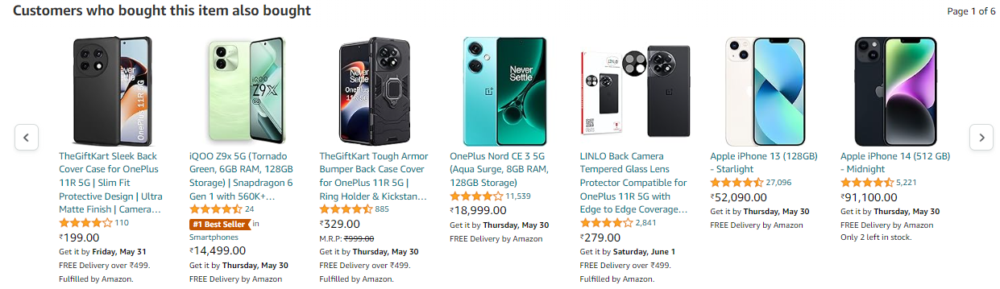

This approach not only addresses the limitations of content-based filtering but also leverages user interactions, making it more robust. By focusing on the historical performance of users, this recommendation system can predict future preferences with greater accuracy.

There are 2 types of collaborative filtering:-

#### User-Based Collaborative Filtering

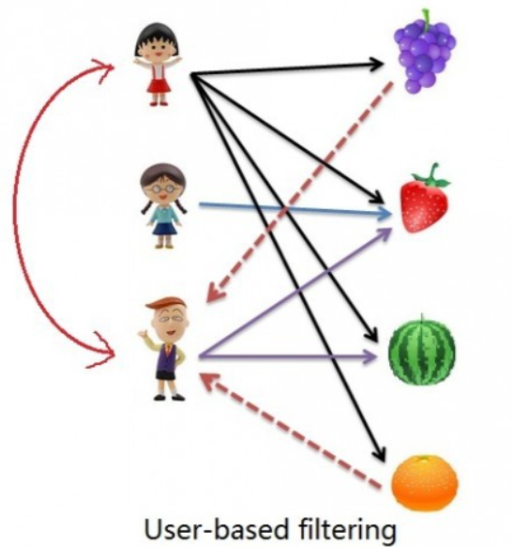

Rating of the item is done using the rating of neighbouring users. In simple words, It is based on the notion of users’ similarity.

Let see an example. On the left side, you can see a picture where 3 children named A, B, C, and 4 fruits i.e, grapes, strawberry, watermelon, and orange respectively.

Based on the image let assume A purchased all 4 fruits, B purchased only strawberry and C purchased strawberry as well as watermelon. Here A & C are similar kinds of users because of this C will be recommended Grapes and Orange as shown in dotted line.

#### Item-Based Collaborative Filtering

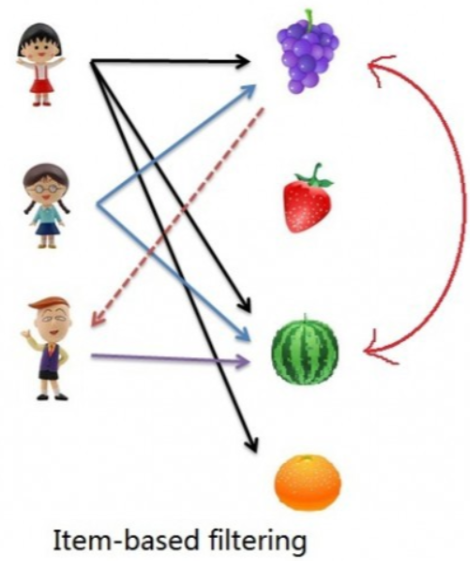

The rating of the item is predicted using the user’s own rating on neighbouring items. In simple words, it is based on the notion of item similarity.

Let us see with an example as told above about users and items. Here the only difference is that we see similar items, not similar users like if you see grapes and watermelon you will realize that watermelon is purchased by all of them but grapes are purchased by Children A & B. Hence Children C is being recommended grapes.

Now after understanding both of them you may be wondering which to use when. Here is the solution if No. of items is greater than No. of users go with user-based collaborative filtering as it will reduce the computation power and If No. of users is greater than No. of items go with item-based collaborative filtering. For Example, Amazon has lakhs of items to sell but has billions of customers. Hence Amazon uses item-based collaborative filtering because of less no. of products as compared to its customers.

#### User-Item Matrix

Collaborative filtering is based on the idea that similar people (based on the data) generally tend to like similar things. It predicts which item a user will like based on the item preferences of other similar users.

Collaborative filtering uses a **user-item matrix** to generate recommendations. This matrix contains the values that indicate a user’s preference towards a given item. These values can represent either explicit feedback (direct user ratings) or implicit feedback (indirect user behavior such as listening, purchasing, watching).

* **Explicit Feedback**: The amount of data that is collected from the users when they choose to do so. Many of the times, users choose not to provide data for the user. So, this data is scarce and sometimes costs money.  For example, ratings from the user.
* **Implicit Feedback**: In implicit feedback, we track user behavior to predict their preference.

**Example 1:**
* Consider a user x, we need to find another user whose rating are similar to x’s rating, and then we estimate x’s rating based on another user.
  
  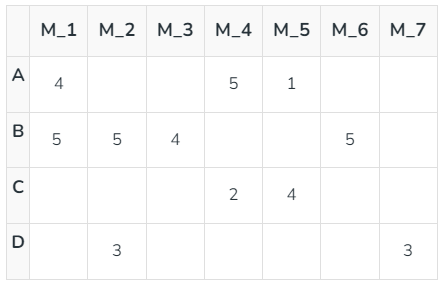

  

* Let’s create a matrix representing different user and movies:
* Consider two users x, y with rating vectors $r_x$ and $r_y$. We need to decide a similarity matrix to calculate similarity b/w sim(x,y). THere are many methods to calculate similarity such as: **Jaccard similarity, cosine similarity and pearson similarity**. Here, we use centered cosine similarity/ pearson similarity, where we normalize the rating by subtracting the mean:

  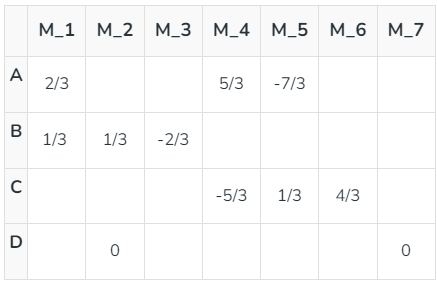

* Here, we can calculate similarity: For ex: sim(A,B) = cos($r_A$, $r_B$) = 0.09 ; sim(A,C) = -0.56. sim(A,B) > sim(A,C).

**Example 2:**

* Formula for Cosine Similarity:
  
  $Similarity(\vec A, \vec B)=\frac{\vec A \cdot \vec B}{||\vec A||*||\vec B||}$

* **Prediction Computation**: The second stage involves executing a recommendation system. It uses the items (already rated by the user) that are most similar to the missing item to generate rating. We hence try to generate predictions based on the ratings of similar products. We compute this using a formula which computes rating for a particular item using weighted sum of the ratings of the other similar products.

  $rating(U, I_i)= \frac {\sum_{j}rating(U, I_j)*s_{ij}}{\sum_{j}s_{ij}}$

* Given below is a set table that contains some items and the user who have rated those items. The rating is explicit and is on a scale of 1 to 5. Each entry in the table denotes the rating given by a $i^{th}$ User to a $j^{th}$ Item. In most cases majority of cells are empty as a user rates only for few items. Here, we have taken 4 users and 3 items. We need to find the missing ratings for the respective user.

  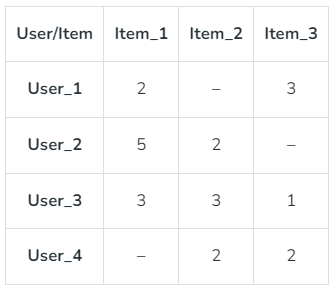

* **Step 1: Finding similarities of all the item pairs**

  Form the item pairs. For example in this example the item pairs are (Item_1, Item_2), (Item_1, Item_3), and (Item_2, Item_3). Select each item to pair one by one. After this, we find all the users who have rated for both the items in the item pair. Form a vector for each item and calculate the similarity between the two items using the cosine formula stated above.

    * **Sim(Item1, Item2) -**

  In the table, we can see only User_2 and User_3 have rated for both items 1 and 2.
  Thus, let $I1$ be vector for Item_1 and $I2$ be for Item_2. Then,
  
  $I1 = 5*U2 +  3*U3$ and,

  $I2 = 2*U2 +  3*U3$

  $Similarity(I1, I2) = \frac{(5*2) + (3*3)}{\sqrt{5^2 + 3^2} \sqrt{2^2 + 3^2}} = 0.90$

    * **Sim(Item2, Item3) -**

  In the table we can see only User_3 and User_4 have rated for both the items 1 and 2.
  Thus, let $I2$ be vector for Item_2 and $I3$ be for Item_3. Then,
  
  $I2 = 3*U3 +  2*U4$ and,

  $I3 = 1*U3 +  2*U4$

  $Similarity(I2, I3) = \frac{(3*1) + (2*2)}{\sqrt{3^2 + 2^2} \sqrt{1^2 + 2^2}} = 0.869$

    * Sim(Item1, Item3)

  In the table we can see only User_1 and User_3 have rated for both the items 1 and 2.
  Thus, let $I1$ be vector for Item_1 and $I3$ be for Item_3. Then,
  
  $I1 = 2*U1 +  3*U3$ and,
  
  $I3 = 3*U1 +  1*U3$

  $Similarity(I1, I3) = \frac{(2*3) + (3*1)}{\sqrt{2^2 + 3^2} \sqrt{3^2 + 1^2}} = 0.789$


* **Step 2: Generating the missing ratings in the table**

  Now, in this step we calculate the ratings that are missing in the table.

  Rating of Item_2 for User_1

  $r(U_1, I_2)=\frac {r(U_1, I_1)*s_{I_1I_2} + r(U_1, I_3)*s_{I_3I_2}}{s_{I_1I_2} + s_{I_3I_2}}=\frac{(2*0.9) + (3*0.869)}{(0.9 + 0.869)} = 2.49$

  Rating of Item_3 for User_2

  $r(U_2, I_3)=\frac {r(U_2, I_1)*s_{I_1I_3} + r(U_2, I_2)*s_{I_2I_3}}{s_{I_1I_3} + s_{I_2I_3}}=\frac{(5*0.789) + (2*0.869)}{(0.789 + 0.869)} = 3.43$

  Rating of Item_1 for User_4

  $r(U_4, I_1)=\frac {r(U_4, I_2)*s_{I_1I_2} + r(U_4, I_3)*s_{I_1I_3}}{s_{I_1I_2} + s_{I_1I_3}}=\frac{(2*0.9) + (2*0.789)}{(0.9 + 0.789)} = 2.0$

**Rating Predictions**

Let $r_x$ be the vector of user x’s rating. Let N be the set of k similar users who also rated item i. Then we can calculate the prediction of user x and item i by using following formula:

$r_{xi} = \frac{\sum_{y \in N}S_{xy}r_{yi}}{\sum_{y \in N}S_{xy}} \, \, S_{xy} = sim(x,y)$

#### Advantages and Disadvantages

**Advantages**
* It works well even if the data is small.
* This model helps the users to discover a new interest in a given item but the model might still recommend it because similar users are interested in that item.
* No need for Domain Knowledge

**Disadvantages**
* It cannot handle new items because the model doesn’t get trained on the newly added items in the database. This problem is known as Cold Start Problem.
* Side Feature Doesn’t have much importance. Here Side features can be actor name or releasing year in the context of movie recommendation.

### Implementation of Recommendation System

We'll be making a movie recommendation system first by using two datasets - 'Ratings', and 'Movies'.

**Importing Libraries**

In [ ]:
# Importing Libraries
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

The Python environment for data analysis and visualization is initialized using this line of code. First, it imports essential libraries for data processing and visualization, including NumPy, Pandas, scikit-learn, Matplotlib, and Seaborn. It also sets up the code to suppress future warnings, so that cautions about upcoming library changes don’t clog the output and create a messier, less productive workspace. These preparatory actions create the framework for effective data exploration and analysis with the imported tools.

**Loading Datasets**

Download these two datasets -
* [Ratings](https://drive.google.com/file/d/1FiCWWEftqT4XmDFasEEJqxlrHmylMfD1/view?usp=sharing)
* [Movies](https://drive.google.com/file/d/1sGZITQ7uBEC0IMw7OmUvBjam8PoaC0Hz/view?usp=sharing)

In [ ]:
#loading rating dataset
ratings = pd.read_csv('/content/ratings.csv')

# loading movie dataset
movies = pd.read_csv('/content/movies.csv')

ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100836 entries, 0 to 100835
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   userId     100836 non-null  int64  
 1   movieId    100836 non-null  int64  
 2   rating     100836 non-null  float64
 3   timestamp  100836 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 3.1 MB


In [ ]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9742 entries, 0 to 9741
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  9742 non-null   int64 
 1   title    9742 non-null   object
 2   genres   9742 non-null   object
dtypes: int64(1), object(2)
memory usage: 228.5+ KB


In [ ]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [ ]:
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


**Statistical Analysis of Ratings**

In [ ]:
n_ratings = len(ratings)
n_movies = len(ratings['movieId'].unique())
n_users = len(ratings['userId'].unique())

print(f"Number of ratings: {n_ratings}")
print(f"Number of unique movieId's: {n_movies}")
print(f"Number of unique users: {n_users}")
print(f"Average ratings per user: {round(n_ratings/n_users, 2)}")
print(f"Average ratings per movie: {round(n_ratings/n_movies, 2)}")

Number of ratings: 100836
Number of unique movieId's: 9724
Number of unique users: 610
Average ratings per user: 165.3
Average ratings per movie: 10.37


**User Rating Frequency**

In [ ]:
# User Rating Frequency

user_freq = ratings[['userId', 'movieId']].groupby(
    'userId').count().reset_index()
user_freq.columns = ['userId', 'n_ratings']
print(user_freq.head())

   userId  n_ratings
0       1        232
1       2         29
2       3         39
3       4        216
4       5         44


**Movie Rating Analysis**

In [ ]:
# Find Lowest and Highest rated movies:
mean_rating = ratings.groupby('movieId')[['rating']].mean()

# Lowest rated movies
lowest_rated = mean_rating['rating'].idxmin()
movies.loc[movies['movieId'] == lowest_rated]

,movieId,title,genres
2689,3604,Gypsy (1962),Musical


In [ ]:
# Highest rated movies
highest_rated = mean_rating['rating'].idxmax()
movies.loc[movies['movieId'] == highest_rated]

,movieId,title,genres
48,53,Lamerica (1994),Adventure|Drama


In [ ]:
# show number of people who rated movies rated movie highest
ratings[ratings['movieId']==highest_rated]

,userId,movieId,rating,timestamp
13368,85,53,5.0,889468268
96115,603,53,5.0,963180003


In [ ]:
# show number of people who rated movies rated movie lowest
ratings[ratings['movieId']==lowest_rated]

,userId,movieId,rating,timestamp
13633,89,3604,0.5,1520408880


In [ ]:
## the above movies has very low dataset. We will use bayesian average
movie_stats = ratings.groupby('movieId')[['rating']].agg(['count', 'mean'])
movie_stats.columns = movie_stats.columns.droplevel()

In [ ]:
movie_stats

,count,mean
movieId,,
1,215,3.920930
2,110,3.431818
3,52,3.259615
4,7,2.357143
5,49,3.071429
...,...,...
193581,1,4.000000
193583,1,3.500000
193585,1,3.500000


To determine which movies in the dataset have the lowest and highest ratings, this algorithm analyzes movie reviews. It determines the average ratings for every film, making it possible to identify which ones have the lowest and greatest average ratings. Subsequently, the algorithm accesses and presents the information about these films from the’movies’ dataset. It also sheds light on the popularity and audience involvement of the movie by displaying the number of users who rated both the highest and lowest-ranked ones. This gives insights into user engagement. Bayesian averages may offer more accurate quality ratings for films with a small number of ratings.

**User-Item Matrix Creation**

In [ ]:
# Now, we create user-item matrix using scipy csr matrix
from scipy.sparse import csr_matrix

def create_matrix(df):

	N = len(df['userId'].unique())
	M = len(df['movieId'].unique())

	# Map Ids to indices
	user_mapper = dict(zip(np.unique(df["userId"]), list(range(N))))
	movie_mapper = dict(zip(np.unique(df["movieId"]), list(range(M))))

	# Map indices to IDs
	user_inv_mapper = dict(zip(list(range(N)), np.unique(df["userId"])))
	movie_inv_mapper = dict(zip(list(range(M)), np.unique(df["movieId"])))

	user_index = [user_mapper[i] for i in df['userId']]
	movie_index = [movie_mapper[i] for i in df['movieId']]

	X = csr_matrix((df["rating"], (movie_index, user_index)), shape=(M, N))

	return X, user_mapper, movie_mapper, user_inv_mapper, movie_inv_mapper

X, user_mapper, movie_mapper, user_inv_mapper, movie_inv_mapper = create_matrix(ratings)

A user-item matrix is a basic data structure in recommendation systems, and it is created by the code that is given. This is how it operates:

* To find the number of unique users and unique videos in the dataset, N and M are computed.
* There are four dictionaries produced:
  * **user_mapper**: Maps distinct user IDs to indexes (user ID 1 becomes index 0 for example).
  * **movie_mapper**: Converts distinct movie IDs into indices (movie ID 1 becomes index 0 for example).
  * **user_inv_mapper**: Reverses user_mapper and maps indices back to user IDs.
  * **movie_inv_mapper**: Reverses movie_mapper by mapping indices to movie IDs.
* To map the real user and movie IDs in the dataset to their matching indices, the lists user_index and movie_index are generated.
* A sparse matrix X is created using the SciPy function csr_matrix. The user and movie indices that correspond to the rating values in the dataset are used to generate this matrix. The form of it is (M, N), where M denotes the quantity of distinct films and N denotes the quantity of distinct consumers.

To put it another way, this code makes it easy to do calculations and create recommendation systems based on the structured representation of user ratings for movies in the data.

#### Movie Similarity Analysis (Item-Based Collaborative Filtering)

In [ ]:
"""
Find similar movies using KNN
"""
from sklearn.neighbors import NearestNeighbors

def find_similar_movies(movie_id, X, k, metric='cosine', show_distance=False):

	neighbour_ids = []

	movie_ind = movie_mapper[movie_id]
	movie_vec = X[movie_ind]
	k+=1
	kNN = NearestNeighbors(n_neighbors=k, algorithm="brute", metric=metric)
	kNN.fit(X)
	movie_vec = movie_vec.reshape(1,-1)
	neighbour = kNN.kneighbors(movie_vec, return_distance=show_distance)
	for i in range(0,k):
		n = neighbour.item(i)
		neighbour_ids.append(movie_inv_mapper[n])
	neighbour_ids.pop(0)
	return neighbour_ids


movie_titles = dict(zip(movies['movieId'], movies['title']))

movie_id = 3

similar_ids = find_similar_movies(movie_id, X, k=10)
movie_title = movie_titles[movie_id]

print(f"Since you watched {movie_title}, here are some movies you might also like:")
for i in similar_ids:
	print(movie_titles[i])

Since you watched Grumpier Old Men (1995), here are some movies you might also like:
Grumpy Old Men (1993)
Striptease (1996)
Nutty Professor, The (1996)
Twister (1996)
Father of the Bride Part II (1995)
Broken Arrow (1996)
Bio-Dome (1996)
Truth About Cats & Dogs, The (1996)
Sabrina (1995)
Birdcage, The (1996)


The provided code defines a function, **find_similar_movies**, which uses the k-Nearest Neighbors (KNN) algorithm to identify movies that are similar to a given movie. The function takes inputs such as the target movie ID, a user-item matrix (X), the number of neighbors to consider (k), a similarity metric (default is cosine similarity), and an option to show distances between movies. The function begins by initializing a blank list to hold the IDs of films that are comparable. It takes the target movie’s index out of the movie_mapper dictionary and uses the user-item matrix to acquire the feature vector that goes with it. Next, the KNN model is configured using the given parameters.

The distances and indices of the k-nearest neighbors to the target movie are calculated once the KNN model has been fitted. Using the **movie_inv_mapper** dictionary, the loop retrieves these neighbor indices and maps them back to movie IDs. Since it matches the desired movie, the first item in the list is eliminated. The code ends with a list of related movie titles and the title of the target film, suggesting movies based on the KNN model.

#### Movie Recommendation with respect to Users Preference (User-Based Collaborative Filtering)

We will create a function to recommend the movies based on the user preferences.

In [ ]:
def recommend_movies_for_user(user_id, X, user_mapper, movie_mapper, movie_inv_mapper, k=10):
	df1 = ratings[ratings['userId'] == user_id]

	if df1.empty:
		print(f"User with ID {user_id} does not exist.")
		return

	movie_id = df1[df1['rating'] == max(df1['rating'])]['movieId'].iloc[0]

	movie_titles = dict(zip(movies['movieId'], movies['title']))

	similar_ids = find_similar_movies(movie_id, X, k)
	movie_title = movie_titles.get(movie_id, "Movie not found")

	if movie_title == "Movie not found":
		print(f"Movie with ID {movie_id} not found.")
		return

	print(f"Since you watched {movie_title}, you might also like:")
	for i in similar_ids:
		print(movie_titles.get(i, "Movie not found"))

The function accepts the following inputs: dictionaries (user_mapper, movie_mapper, and movie_inv_mapper) for mapping user and movie IDs to matrix indices; the user_id for which recommendations are desired; a user-item matrix X representing movie ratings; and an optional parameter k for the number of recommended movies (default is 10).

* It initially filters the ratings dataset to see if the user with the given ID is there. It notifies the user that the requested person does not exist and ends the function if the user does not exist (the filtered DataFrame is empty).
* The code, if it exists, designates the movie that has received the highest rating from that particular user. It finds the movieId of this movie and chooses it based on the highest rating.
* With information from the movies dataset, a dictionary called movie_titles is created to map movie IDs to their titles. The function then uses find_similar_movies to locate films that are comparable to the movie in the user-item matrix that has the highest rating (denoted by movie_id). It gives back a list of comparable movie IDs.
* The code searches the movie titles dictionary for the title of the highest-rated film, and if the film is not found, it sets the title to “Movie not found.” When a movie title is retrieved as “Movie not found,” it means that the highest-rated film (based on movie_id) is not present in the dataset. If the movie is located, the customer is presented with recommendations for other movies based on the highest rated film. The list of comparable movie IDs is iterated over, and the titles are printed. When a movie isn’t discovered in the dataset, the default message is “Movie not found.”
* The function handles situations where the user or movie doesn’t exist in the dataset and is intended to suggest movies for a particular user based on their highest-rated film. The code calls the function with the necessary parameters and sets the user_id to a specific user to show how to utilize the method.

In [ ]:
# Let's get some recommendations now

user_id = 150 # Replace with the desired user ID
recommend_movies_for_user(user_id, X, user_mapper, movie_mapper, movie_inv_mapper, k=10)

Since you watched Twelve Monkeys (a.k.a. 12 Monkeys) (1995), you might also like:
Pulp Fiction (1994)
Terminator 2: Judgment Day (1991)
Independence Day (a.k.a. ID4) (1996)
Seven (a.k.a. Se7en) (1995)
Fargo (1996)
Fugitive, The (1993)
Usual Suspects, The (1995)
Jurassic Park (1993)
Star Wars: Episode IV - A New Hope (1977)
Heat (1995)


In [ ]:
user_id = 2300 # Replace with the desired user ID
recommend_movies_for_user(user_id, X, user_mapper, movie_mapper, movie_inv_mapper, k=10)

User with ID 2300 does not exist.


* In conclusion, developing a Recommendation system allows for the creation of tailored content recommendations that improve user experience and take into account user preferences.
* Through the utilization of collaborative filtering, content-based filtering, and hybrid techniques, these systems are able to offer customized recommendations to consumers for content, movies, or items.
* These systems use sophisticated methods such as closest neighbors and matrix factorization to find hidden patterns in item attributes and user behavior.
* Recommendation systems are able to adjust and get better over time thanks to the combination of machine learning and data-driven insights.
* In the end, these solutions are essential for raising consumer satisfaction, improving user engagement, and propelling corporate expansion in a variety of industries.

### Implementation of Item-Based Collaborative Filtering - Another Example

In this implementation, we will build an item-based recommendation system which recommends top-5 books to the user based on their choice. You can download the datasets from here: -

* [Books](https://drive.google.com/file/d/1B6rzt1iinACpld2g12ZZVJzBWAN05Emb/view?usp=sharing)
* [Ratings](https://drive.google.com/file/d/1tgdHxvoLTFzuMcPDykK2MhlQJPiWiyhQ/view?usp=sharing)
* [Users](https://drive.google.com/file/d/1GsVG0n0pDGeQqyUNOBA5nZUIYXhHKAIL/view?usp=sharing)

**Step 1: Importing Necessary libraries**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity

**Step 2: Load the Dataset**

In [ ]:
# Load datasets
users = pd.read_csv('/content/Users.csv')
books = pd.read_csv('/content/Books.csv')
ratings = pd.read_csv('/content/Ratings (1).csv')

# Get dataset info
users.info()
books.info()
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187080 entries, 0 to 187079
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 187080 non-null  object
 1   Book-Title           187080 non-null  object
 2   Book-Author          187079 non-null  object
 3   Year-Of-Publication  187080 non-null  int64 
 4   Publisher            187078 non-null  object
 5   Image-URL-S          187080 non-null  object
 6   Image-URL-M          187080 non-null  object
 7   Image-URL-L          187080 non-null  object
dtypes: int64(1), 

In [ ]:
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [ ]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [ ]:
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


**Step 3: Data Cleaning and Preparation**

In this step, we clean the data and get it ready for model building.

We have many records with the same book title with different publishers and publishing years. So, we drop the rows with duplicate book titles and store it in the ‘new_book‘ data frame.

In [ ]:
# Drop rows with duplicate book title
new_books = books.drop_duplicates('Book-Title')

We then merge the ‘ratings‘ df with ‘new_books‘ df on ‘ISBN‘ i.e. unique identification number for books and store the result in ‘ratings_with_name‘. We also drop the columns that we do not require like ‘ISBN‘, ‘Image-URL-S’ etc.

In [ ]:
# Merge ratings and new_books df
ratings_with_name = ratings.merge(new_books, on='ISBN')

# Drop non-relevant columns
ratings_with_name.drop(['ISBN', 'Image-URL-S', 'Image-URL-M', 'Image-URL-L'], axis = 1, inplace = True)

Now, we merge the ‘ratings‘ df with ‘users‘ df to get ‘users_ratings_matrix‘. Similarly, we will drop the non-relevant columns.

In [ ]:
# Merge new 'ratings_with_name' df with users df
users_ratings_matrix = ratings_with_name.merge(users, on='User-ID')

# Drop non-relevant columns
users_ratings_matrix.drop(['Location', 'Age'], axis = 1, inplace = True)

# Print the first few rows of the new dataframe
users_ratings_matrix.head()

,User-ID,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,276725,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books
1,2313,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books
2,2313,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage
3,2313,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins
4,2313,5,The Mistress of Spices,Chitra Banerjee Divakaruni,1998,Anchor Books/Doubleday


Checking and dropping null values.

In [ ]:
# Check for null values
users_ratings_matrix.isna().sum()
# Drop null values
users_ratings_matrix.dropna(inplace = True)
print(users_ratings_matrix.isna().sum())

User-ID                0
Book-Rating            0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64


Since we have too many entries in **‘users_ratings_matrix‘**. We will filter down the matrix to users who gave many book ratings and then filter on the basis most rated books.

The code filters a DataFrame **users_ratings_matrix** containing user-book interactions based on two criteria:

* **Users with Many Book Ratings**: It groups the DataFrame by the ‘User-ID’ column and counts the number of ratings each user has given creating a boolean mask x where each entry indicates whether the user has given more than 100 ratings.
* **Books with Most Ratings**: It further filters the DataFrame filtered_users_ratings (which contains users with many ratings) based on books that have received at least 50 ratings.

In [ ]:
# Filter down 'users_ratings_matrix' on the basis of users who gave many book ratings
x = users_ratings_matrix.groupby('User-ID').count()['Book-Rating'] > 100
knowledgeable_users = x[x].index
filtered_users_ratings = users_ratings_matrix[users_ratings_matrix['User-ID'].isin(knowledgeable_users)]

# Filter down 'users_ratings_matrix' on the basis of books with most ratings
y = filtered_users_ratings.groupby('Book-Title').count()['Book-Rating'] >= 50
famous_books = y[y].index
final_users_ratings = filtered_users_ratings[filtered_users_ratings['Book-Title'].isin(famous_books)]

Now, we will create the pivot table for **‘final_users_ratings‘** df. It will be a **sparse user-rating matrix** where each row will contain all the user ratings for a particular item and each column will contain all the item ratings by a particular user.

In [ ]:
# Pivot table creation
pivot_table = final_users_ratings.pivot_table(index = 'Book-Title', columns = 'User-ID', values = 'Book-Rating')

# Filling the NA values with '0'
pivot_table.fillna(0, inplace = True)
pivot_table.head()

User-ID,254,507,882,1424,1435,1733,1903,2033,2110,2276,...,274549,274808,275020,275970,276680,277427,277478,277639,278188,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1st to Die: A Novel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2nd Chance,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4 Blondes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


There is no standalone library for implementing centered cosine similarity in scikit-learn. So, first, we standardize the pivot table using **‘StandardScaler‘** and then use cosine similarity on the standardized data.

In [ ]:
# Standardize the pivot table
scaler = StandardScaler(with_mean=True, with_std=True)
pivot_table_normalized = scaler.fit_transform(pivot_table)

**Step 4: Model Building**

First, we calculate the similarity matrix for all the items using **‘cosine_similarity‘**.

In [ ]:
# Calculate the similarity matrix for all the books
similarity_score = cosine_similarity(pivot_table_normalized)

Then, we create a function called ```recommend()``` which recommends to top books to the user based on their choice.

* The code finds the numerical index of the given book name in the pivot table.
* It sorts the similarity scores for the given book in descending order.
* It selects the top 5 similar books (excluding the given book itself).
* It retrieves the details (title, author, and image URL) of the similar books from the ```new_books``` DataFrame.
* It formats the information and returns it as a list.

In [ ]:
def recommend(book_name):

    # Returns the numerical index for the book_name
    index = np.where(pivot_table.index==book_name)[0][0]

    # Sorts the similarities for the book_name in descending order
    similar_books = sorted(list(enumerate(similarity_score[index])),key=lambda x:x[1], reverse=True)[1:6]

    # To return result in list format
    data = []

    for index,similarity in similar_books:
        item = []
        # Get the book details by index
        temp_df = new_books[new_books['Book-Title'] == pivot_table.index[index]]

        # Only add the title, author, and image-url to the result
        item.extend(temp_df['Book-Title'].values)
        item.extend(temp_df['Book-Author'].values)
        item.extend(temp_df['Image-URL-M'].values)

        data.append(item)
    return data

**Step 5: Model Validating**

In [ ]:
# Call the recommend method
result = recommend('1984')

In [ ]:
result

[["Foucault's Pendulum",
  'Umberto Eco',
  'http://images.amazon.com/images/P/0345368754.01.MZZZZZZZ.jpg'],
 ['Animal Farm',
  'George Orwell',
  'http://images.amazon.com/images/P/0451526341.01.MZZZZZZZ.jpg'],
 ['Tis : A Memoir',
  'Frank McCourt',
  'http://images.amazon.com/images/P/0684848783.01.MZZZZZZZ.jpg'],
 ['The Glass Lake',
  'Maeve Binchy',
  'http://images.amazon.com/images/P/0440221595.01.MZZZZZZZ.jpg'],
 ["Slaughterhouse Five or the Children's Crusade: A Duty Dance With Death",
  'Kurt Vonnegut',
  'http://images.amazon.com/images/P/0440180295.01.MZZZZZZZ.jpg']]

## Case Study - Music Recommendation System using Spotify Dataset

**Introduction**

In the digital age, music streaming services have revolutionized the way people consume music. With millions of tracks available at their fingertips, users often face the paradox of choice, leading to the growing importance of effective recommendation systems. This case study explores the development of a music recommendation system using a comprehensive Spotify dataset, leveraging multiple data points to enhance the user experience.

**Objectives**

The primary objective of this project is to design and implement a music recommendation system that can suggest tracks to users based on their listening habits, preferences, and patterns found in the data. The system aims to:

* Provide personalized music recommendations.
* Increase user engagement by suggesting relevant tracks.
* Enhance user satisfaction by offering diverse music choices.

**Dataset Overview**

The Spotify dataset comprises four distinct CSV files, each containing valuable information for building the recommendation system:

* **[data.csv](https://drive.google.com/file/d/1ECT--WYgliEMVOsefUH7b3X8c1pe6wqn/view?usp=sharing)**: This file contains detailed information about individual tracks, including features like danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, and track duration.

  * **valence**: A measure of the musical positiveness conveyed by a track ranging from 0 to 1.
  * **year**: The year when the track was released.
  * **acousticness**: A measure of the acoustic characteristics of the track, ranging from 0 to 1.
  * **artists**: Names of the artists or group associated with the track.
  danceability: A measure of how suitable a track is for dancing, ranging from 0 to 1.
  * **duration_ms**: The duration of the track in milliseconds.
  * **energy**: Represents the energy level of the track, ranging from 0 to 1.
  * **explicit**: Indicates whether the track contains explicit content (1 for explicit, 0 for not explicit).
  * **id**: A unique identifier for the track.
  * **instrumentalness**: Indicates the likelihood of the track containing no vocals, ranging from 0 to 1.
  * **key**: The key the track is in.
  * **liveness**: A measure of the presence of a live audience in the track, ranging from 0 to 1.
  * **loudness**: The overall loudness of the track in decibels (dB).
  * **mode**: Indicates the modality of the track (major or minor, 1 for major, 0 for minor).
  * **name**: The name of the track.
  * **popularity**: A measure of the popularity of the track, ranging from 0 to 100.
  * **release_date**: The date when the track was released.
  * **speechiness**: Detects the presence of spoken words in the track, ranging from 0 to 1.
  * **tempo**: The tempo of the track in beats per minute (BPM).

* **[data_by_genres.csv](https://drive.google.com/file/d/1o_CgSPtX-RgeJOLuGcIhNjWjAUo3MPeK/view?usp=sharing)**: This file aggregates music data by genres, providing an overview of various music genres along with their average feature values.

  * **Mode**: This column indicates a categorical variable representing some mode or category associated with the music tracks.
  * **Genres**: This column specifies the genre or style of music.
  * **Acousticness**: A numeric value representing the level of acousticness in the track, ranging from 0 to 1, where 0 indicates not acoustic at all and 1 indicates highly acoustic.
  * **Danceability**: A numeric value representing how suitable a track is for dancing, ranging from 0 to 1, where 0 indicates not danceable and 1 indicates highly danceable.
  * **Duration_ms**: The duration of the track in milliseconds.
  * **Energy**: A numeric value representing the energy of the track, likely in the musical sense, ranging from 0 to 1.
  * **Instrumentalness**: A numeric value representing the likelihood that the track contains no vocals, ranging from 0 to 1.
  * **Liveness**: A numeric value representing the probability that the track was performed live, ranging from 0 to 1.
  * **Loudness**: The overall loudness of the track in decibels (dB).
  * **Speechiness**: A numeric value representing the presence of spoken words in the track, ranging from 0 to 1.
  * **Tempo**: The tempo of the track in beats per minute (BPM).
  * **Valence**: A numeric value representing the musical positiveness conveyed by a track, ranging from 0 to 1, where 0 indicates negative and 1 indicates positive.
  * **Popularity**: A numeric value representing the popularity of the track.
  * **Key**: A categorical variable representing the key of the track.

* **[data_by_year.csv](https://drive.google.com/file/d/1VjEed6InXvftyaMBGm9rcaHOOwlQivYl/view?usp=sharing)**: This dataset includes music data organized by release year, capturing trends and changes in musical features over time.

  * Contains pretty much the same columns as **data_by_genres**

* **[data_by_artist.csv](https://drive.google.com/file/d/1rqkVNTuM9joyNi_97WKoLDC9ecD2vfQF/view?usp=sharing)**: This file provides information aggregated by artists, offering insights into the characteristics and styles of different artists.

  * **Mode**: Indicates the modality of the track (0 = Minor, 1 = Major).
  * **Count**: Represents the count of something related to the track, but the meaning is not explicitly clear from the provided snippet.
  * **Acousticness**: A measure of the acoustic characteristics of the track, where 0 represents low acousticness and 1 represents high acousticness.
  * **Artists**: The name of the artist or artists associated with the track.
  * **Danceability**: Represents how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity.
  * **Duration_ms**: The duration of the track in milliseconds.
  * **Energy**: Represents the intensity and activity of the track. Typically, energetic tracks feel fast, loud, and noisy.
  * **Instrumentalness**: Indicates the likelihood of the track containing no vocals. A high value suggests the track is instrumental.
  * **Liveness**: Represents the presence of a live audience in the recording. A value closer to 1 suggests higher liveness.
  * **Loudness**: The overall loudness of the track in decibels (dB).
  * **Speechiness**: Detects the presence of spoken words in a track. The more exclusively speech-like the recording, the closer to 1.0 the attribute value.
  * **Tempo**: The overall estimated tempo of the track in beats per minute (BPM).
  * **Valence**: Describes the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g., happy, cheerful), while tracks with low valence sound more negative (e.g., sad, depressed).
  * **Popularity**: Represents the popularity of the track, likely based on metrics such as play counts or listener engagement.
  * **Key**: The key of the track.

**Data Preprocessing**

* **Data Cleaning**: Handle missing values, remove duplicates, and ensure data consistency.
* **Normalization**: Normalize feature values to ensure uniformity and improve model performance.
* **Feature Selection**: Identify and select relevant features from the datasets for building the recommendation model.

**Exploratory Data Analysis (EDA)**

* **Trend Analysis**: Analyze trends in music features over years and genres.
* **Correlation Analysis**: Identify correlations between different musical features to understand their relationships.

**Importing Necessary Libraries**

In [ ]:
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from wordcloud import WordCloud

from collections import defaultdict
from scipy.spatial.distance import cdist
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import warnings
warnings.filterwarnings("ignore")


**Importing the Datasets**

In [ ]:
# Saving data from csv to pandas dataframe
data = pd.read_csv('/content/data.csv')
genre_data = pd.read_csv('/content/data_by_genres.csv')
year_data = pd.read_csv('/content/data_by_year.csv')
artist_data = pd.read_csv('/content/data_by_artist.csv')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:

year_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


In [ ]:
artist_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              28680 non-null  int64  
 1   count             28680 non-null  int64  
 2   acousticness      28680 non-null  float64
 3   artists           28680 non-null  object 
 4   danceability      28680 non-null  float64
 5   duration_ms       28680 non-null  float64
 6   energy            28680 non-null  float64
 7   instrumentalness  28680 non-null  float64
 8   liveness          28680 non-null  float64
 9   loudness          28680 non-null  float64
 10  speechiness       28680 non-null  float64
 11  tempo             28680 non-null  float64
 12  valence           28680 non-null  float64
 13  popularity        28680 non-null  float64
 14  key               28680 non-null  int64  
dtypes: float64(11), int64(3), object(1)
memory usage: 3.3+ MB


In [ ]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [ ]:
genre_data.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [ ]:
year_data.head()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5


In [ ]:
artist_data.head()

,mode,count,acousticness,artists,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,9,0.590111,"""Cats"" 1981 Original London Cast",0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448000,0.210389,117.518111,0.389500,38.333333,5
1,1,26,0.862538,"""Cats"" 1983 Broadway Cast",0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,30.576923,5
2,1,7,0.856571,"""Fiddler On The Roof” Motion Picture Chorus",0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0
3,1,27,0.884926,"""Fiddler On The Roof” Motion Picture Orchestra",0.425074,262890.962963,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.851852,0
4,1,7,0.510714,"""Joseph And The Amazing Technicolor Dreamcoat""...",0.467143,270436.142857,0.488286,0.009400,0.195000,-10.236714,0.098543,122.835857,0.482286,43.000000,5


### Checking for Null, Duplicates, etc.

In [ ]:
# Combining the datasets for convinient access
datasets = [("data", data), ("genre_data", genre_data), ("year_data", year_data), ("artist_data", artist_data)]

In [ ]:
datasets

[('data',
          valence  year  acousticness  \
  0        0.0594  1921       0.98200   
  1        0.9630  1921       0.73200   
  2        0.0394  1921       0.96100   
  3        0.1650  1921       0.96700   
  4        0.2530  1921       0.95700   
  ...         ...   ...           ...   
  170648   0.6080  2020       0.08460   
  170649   0.7340  2020       0.20600   
  170650   0.6370  2020       0.10100   
  170651   0.1950  2020       0.00998   
  170652   0.6420  2020       0.13200   
  
                                                    artists  danceability  \
  0       ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
  1                                          ['Dennis Day']         0.819   
  2       ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
  3                                        ['Frank Parker']         0.275   
  4                                          ['Phil Regan']         0.418   
  ...                            

In [ ]:
# Typecasting columns for better understanding of the datasets
data['year'] = pd.to_datetime(data['year'], format='%Y')
data['release_date'] = pd.to_datetime(data['release_date'], format = 'mixed')
year_data['year'] = pd.to_datetime(year_data['year'], format='%Y')

In [ ]:
for name, df in datasets:
    # print some info about the datasets
    print(f"Info about the dataset: {name}")
    print("-"*30)
    print(df.info())
    print()

Info about the dataset: data
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   valence           170653 non-null  float64       
 1   year              170653 non-null  datetime64[ns]
 2   acousticness      170653 non-null  float64       
 3   artists           170653 non-null  object        
 4   danceability      170653 non-null  float64       
 5   duration_ms       170653 non-null  int64         
 6   energy            170653 non-null  float64       
 7   explicit          170653 non-null  int64         
 8   id                170653 non-null  object        
 9   instrumentalness  170653 non-null  float64       
 10  key               170653 non-null  int64         
 11  liveness          170653 non-null  float64       
 12  loudness          170653 non-null  float64       
 13 

**Checking for Missing Values**

In [ ]:
for name, df in datasets:
    print(f"Missing Values in: {name}")
    print("-"*30)
    print(df.isnull().sum())
    print()

Missing Values in: data
------------------------------
valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

Missing Values in: genre_data
------------------------------
mode                0
genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64

Missing Values in: year_data
------------------------------
mode                0
year                0
acousticness        0
danc

**Checking for Duplicate Values**

In [ ]:
for name, df in datasets:
    print(f"Duplicates in the dataset: {name}")
    print("-"*30)
    print(df.duplicated(keep=False).sum())
    print()

Duplicates in the dataset: data
------------------------------
0

Duplicates in the dataset: genre_data
------------------------------
0

Duplicates in the dataset: year_data
------------------------------
0

Duplicates in the dataset: artist_data
------------------------------
0



**Checking the Unique Values**

In [ ]:
for name, df in datasets:
    print(f"Unique Values in: {name}")
    print("-"*30)
    print(df.nunique())
    print()

Unique Values in: data
------------------------------
valence               1733
year                   100
acousticness          4689
artists              34088
danceability          1240
duration_ms          51755
energy                2332
explicit                 2
id                  170653
instrumentalness      5401
key                     12
liveness              1740
loudness             25410
mode                     2
name                133638
popularity             100
release_date         10968
speechiness           1626
tempo                84694
dtype: int64

Unique Values in: genre_data
------------------------------
mode                   2
genres              2973
acousticness        2798
danceability        2725
duration_ms         2872
energy              2778
instrumentalness    2731
liveness            2709
loudness            2873
speechiness         2707
tempo               2872
valence             2745
popularity          2188
key                   12
dtype: in

### Data Visualization

**Feature Correlation with the 'popularity' variable**

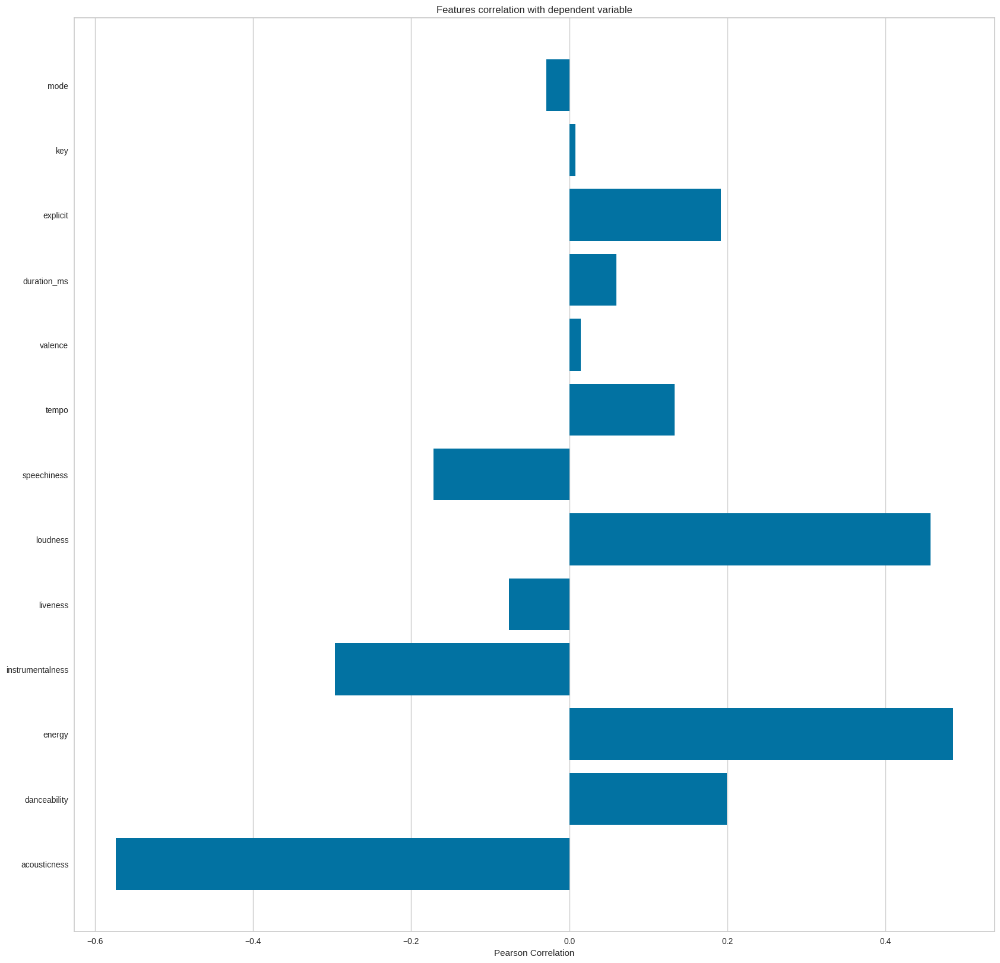

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

**Various Sound Features trend over the years**

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

**Popularity Treads Over the Years**

In [ ]:
# Popularity Trends Over Years
fig = px.line(year_data, x='year', y='popularity', title='Popularity Trends Over the Years', labels={'year': 'Years --->', 'popularity': "Popularity --->"})
fig.show()

This plot shows the trend of popularity of music over the years. The x-axis represents the years, while the y-axis represents the popularity of the music.

The line plot visually illustrates how the popularity of music has changed over time. By observing the trend of the line, one can infer whether music popularity has increased, decreased, or remained relatively stable over the specified time period.

Overall, the Popularity of music kept increasing.

**Number of Songs Released per Decade**

In [ ]:
# Converting release_date to datetime and extract decade
data['release_decade'] = (data['release_date'].dt.year // 10) * 10

# Counting the number of songs per decade
decade_counts = data['release_decade'].value_counts().sort_index()

# Creating a bar chart for songs per decade
fig = px.bar(x=decade_counts.index, y=decade_counts.values, labels={'x': 'Decade --->', 'y': 'Number of Songs --->', 'color':"Color"},
             title='Number of Songs Released per Decade', color=decade_counts.index, color_continuous_scale='Rainbow')
fig.update_layout(xaxis_type='category')
fig.show()

The above code converts the release dates into decades and then counts the number of songs released in each decade. The resulting plot is a bar chart showing the number of songs released per decade. Each bar represents a decade, and the height of the bar indicates the number of songs released during that decade.

The x-axis represents decades, and the y-axis represents the number of songs. The plot provides an overview of the distribution of songs over different decades, which could help in analyzing trends or patterns in music production over time.

**Changes in Tempo Over the Years**

In [ ]:
# Changes in Tempo Over the Years
fig = px.scatter(year_data, x='year', y='tempo', color='tempo', size='popularity',
                 title='Changes in Tempo Over the Years', labels={'tempo': 'Tempo --->', "year":"Years --->"})
fig.show()

From the above code, it is a scatter plot generated to visualize the changes in tempo over the years. Here's what can be inferred:

* **X-axis (year)**: This represents the years over which the tempo data is being analyzed. Each point on the plot likely corresponds to a specific year.

* **Y-axis (tempo)**: This represents the tempo of the music tracks. Tempo is typically measured in beats per minute (BPM). Each point on the plot likely corresponds to the tempo of tracks in a particular year.

* **Color**: The color of the points might represent the tempo values, providing a visual distinction between different tempo ranges or values.

* **Size**: The size of the points might represent the popularity of the tracks. Larger points may indicate more popular tracks, while smaller points may represent less popular ones.

* **Title**: The title of the plot indicates that it visualizes the changes in tempo over the years.

This plot allows viewers to see trends or patterns in tempo changes across different years, and potentially how tempo correlates with track popularity.

**Changes in Energy and Acousticness Over Years**

In [ ]:
# Energy and Acousticness Over Years
fig = go.Figure()

fig.add_trace(go.Scatter(x=year_data['year'], y=year_data['energy'], mode='lines', name='Energy'))
fig.add_trace(go.Scatter(x=year_data['year'], y=year_data['acousticness'], mode='lines', name='Acousticness'))

fig.update_layout(title='Energy and Acousticness Over Years', xaxis_title='Years --->', yaxis_title='Values --->')
fig.show()

The plot displays how the energy and acousticness of music tracks have changed over the years.

* The x-axis represents the years, indicating the timeframe over which the data has been collected.
* The y-axis represents the values of energy and acousticness.
* There are two lines on the plot:
  * The first line (labeled "Energy") represents the trend of energy levels in music tracks over the years.
  * The second line (labeled "Acousticness") represents the trend of acoustic characteristics in music tracks over the years.

By observing the plot, one can interpret how these two attributes have varied over time, providing insights into potential trends or patterns in music production or consumption.

**Changes in Speechiness and Instrumentalness Over Years**

In [ ]:
# Speechiness and Instrumentalness Over Years
fig = go.Figure()

fig.add_trace(go.Scatter(x=year_data['year'], y=year_data['speechiness'], mode='lines', name='Speechiness'))
fig.add_trace(go.Scatter(x=year_data['year'], y=year_data['instrumentalness'], mode='lines', name='Instrumentalness'))

fig.update_layout(title='Speechiness and Instrumentalness Over Years', xaxis_title='Years --->', yaxis_title='Values --->')
fig.show()

The plot displays how the values of speechiness and instrumentalness change over the years. Each line represents one of these attributes, with the x-axis indicating the years and the y-axis representing the values of speechiness and instrumentalness.

* **Speechiness**: This measures the presence of spoken words in the track. A higher value suggests more spoken words or a higher proportion of speech-like content in the music.
* **Instrumentalness**: This indicates the likelihood of the track containing no vocals. A higher value suggests a higher probability that the track is instrumental.

By observing the trends of these attributes over the years, one can infer how speechiness and instrumentalness have evolved in the music industry over time. For instance, if speechiness shows an increasing trend while instrumentalness decreases, it might suggest a shift towards more vocal-oriented music. Conversely, if instrumentalness increases while speechiness decreases, it might indicate a rise in instrumental music.

**Genres Analysis**

**Top Genres by Popularity**

In [ ]:
# Genre Analysis: Top Genres by Popularity
top_10_genre_data = genre_data.nlargest(10, 'popularity')

fig = px.bar(top_10_genre_data, x='popularity', y='genres', orientation='h',
             title='Top Genres by Popularity', color='genres', labels={'popularity': 'Popularity --->', "genres":"Genres --->"})
fig.show()

From this plot, the horizontal bars indicate the popularity of each genre, with the genre names labeled on the y-axis and the corresponding popularity values labeled on the x-axis. Each bar's color represents a different genre. The title of the plot is "Top Genres by Popularity", indicating the purpose of the visualization. Overall, it provides a visual representation of the popularity ranking of different music genres.

The most popular genre according to this graph is Basshall, followed by South African House, Trap Venezolano and Turkish EDM. The least popular genres are Guaracha, Circuit, Afro Soul and Afroswing.

**Danceability Distribution for Top 10 Popular Genres**

In [ ]:
# Genre Analysis: Danceability Distribution for Top 10 Popular Genres
fig = px.bar(top_10_genre_data, x='genres', y='danceability', color='genres',
             title='Danceability Distribution for Top 10 Popular Genres', labels={'genres': 'Genres --->', "danceability":"Daneability --->"})
fig.show()

This code generates a bar plot using Plotly Express (px.bar). The plot displays the distribution of danceability for the top 10 popular genres. Each bar represents a genre, and the height of the bar corresponds to the average danceability score for that genre. The x-axis represents the genres, the y-axis represents the danceability score, and each genre is color-coded for easier differentiation. The title of the plot is "Danceability Distribution for Top 10 Popular Genres", and custom labels are provided for the axes.

Seems like "alberta hip hop" has the most daceability amoung all the other genres.

**Energy Distribution for Top 10 Popular Genres**

In [ ]:
# Genre Analysis: Energy Distribution for Top 10 Popular Genres
fig = px.bar(top_10_genre_data, x='genres', y='energy', color='genres',
             title='Energy Distribution for Top 10 Popular Genres', labels={'genres': 'Genres --->', "energy":"Energy --->"})
fig.show()

From this plot, it is an analysis of the energy distribution across the top 10 popular genres. Each bar represents a different genre, with the x-axis showing the genre names and the y-axis representing the energy level. The color of each bar corresponds to the respective genre.

The plot provides insight into how the energy levels vary across different music genres, helping to visualize which genres tend to have higher or lower energy levels based on the dataset being analyzed.

**Valence Distribution for Top 10 Popular Genres**

In [ ]:
# Genre Analysis: Valence Distribution for Top 10 Popular Genres
fig = px.bar(top_10_genre_data, x='genres', y='valence', color='genres',
             title='Valence Distribution for Top 10 Popular Genres', labels={'genres': 'Genres --->', "valence":"Valence --->"})
fig.show()

From the provided code snippet, it seems that a bar plot is being generated to visualize the valence distribution for the top 10 popular genres.

* **X-axis**: Represents different genres.
* **Y-axis**: Represents the valence (musical positiveness) associated with each genre.
* **Color**: Each bar is colored according to the corresponding genre, making it easier to distinguish between different genres.

By observing this plot, one can analyze how the valence varies across different genres, and which genres tend to have higher or lower valence ratings among the top 10 popular genres.

**Acousticness Distribution for Top 10 Popular Genres**

In [ ]:
# Genre Analysis: Acousticness Distribution for Top 10 Popular Genres
fig = px.bar(top_10_genre_data, x='genres', y='acousticness', color='genres',
             title='Acousticness Distribution for Top 10 Popular Genres', labels={'genres': 'Genres --->', "acousticness":"Acousticness --->"})
fig.show()

This plot is a bar chart showing the distribution of acousticness across the top 10 popular genres. Each bar represents a genre, with the height of the bar indicating the average acousticness value for that genre. The x-axis represents the genres, while the y-axis represents the acousticness values. Additionally, each genre is color-coded for better visualization. The title of the plot indicates that it's specifically analyzing the acousticness distribution for the top 10 popular genres.

**Instrumentalness Distribution for Top 10 Popular Genres**

In [ ]:
# Genre Analysis: Instrumentalness Distribution for Top 10 Popular Genres
fig = px.bar(top_10_genre_data, x='genres', y='instrumentalness', color='genres',
             title='Instrumentalness Distribution for Top 10 Popular Genres', labels={'genres': 'Genres --->', "instrumentalness":"Instrumentalness --->"})
fig.show()

From this plot, it is analyzing the distribution of instrumentalness across the top 10 popular genres. Each genre is represented on the x-axis, and the instrumentalness value for each genre is shown on the y-axis.

* The bars represent the instrumentalness value for each genre.
* The color of the bars indicates the corresponding genre.
* The title of the plot suggests that it's focusing on the instrumentalness distribution across these genres.

This plot provides insights into how instrumental various genres are within the top 10 popular genres, helping to understand the musical characteristics and preferences associated with each genre.

**Top 10 genres on the basis of various Sound Features**

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness', 'instrumentalness'], barmode='group')
fig.show()

**Artists Analysis**

**Average Attributes for Top 10 Popular Artists**

In [ ]:
# Artist Analysis: Average Attributes for Top 10 Popular Artists
top_10_artist_data = artist_data.nlargest(10, 'popularity')

fig = px.bar(top_10_artist_data, x='popularity', y='artists', orientation='h', color='artists',
             title='Top Artists by Popularity', labels={'popularity': 'Popularity --->', "artists":"Artists --->"})
fig.show()

This plot visualizes the average attributes for the top 10 popular artists. The x-axis represents the popularity score, while the y-axis displays the names of the artists. Each horizontal bar represents one artist, with the length of the bar indicating their popularity score. The color of each bar corresponds to the artist it represents. The title of the plot is "Top Artists by Popularity", and the labels on the axes clarify what they represent.

Overall, this plot provides a visual comparison of the popularity of the top 10 artists in the dataset.

**Speechiness vs. Instrumentalness for Top 10 Popular Artists**

In [ ]:
# Artist Analysis: Speechiness vs. Instrumentalness for Top 10 Popular Artists

fig = px.scatter(top_10_artist_data, x='speechiness', y='instrumentalness', color='artists',
                 size='popularity', hover_name='artists',
                 title='Speechiness vs. Instrumentalness for Top Artists', labels={'speechiness': 'Speechiness --->', "instrumentalness":"Instrumentalness --->", "artists":"Artists"})
fig.show()

The plot visualizes the relationship between two audio features, "Speechiness" and "Instrumentalness", for the top 10 popular artists.

* **X-axis (speechiness)**: This represents the speech-like quality of the audio tracks. A higher value indicates more presence of spoken words in the music.

* **Y-axis (instrumentalness)**: This indicates the likelihood of the audio tracks being instrumental, i.e., containing no vocals. A higher value suggests a higher probability of the track being instrumental.

* **Color**: Each point on the scatter plot corresponds to a specific artist. The color differentiation helps identify different artists.

* **Size**: The size of each point might represent the popularity of the artist or their tracks. Larger points indicate higher popularity.

* **Hover**: Hovering over a point would likely display additional information, such as the name of the artist.

This plot essentially allows us to explore the speechiness and instrumentalness characteristics of tracks by the top 10 popular artists, providing insights into their musical style preferences.



**Danceability vs. Energy for Top 10 Popular Artists**

In [ ]:
# Artist Analysis: Danceability vs. Energy for Top 10 Popular Artists
fig = px.scatter(top_10_artist_data, x='danceability', y='energy', color='artists',
                 size='popularity', hover_name='artists',
                 title='Danceability vs. Energy for Top 10 Popular Artists', labels={'danceability': 'Danceability --->', "energy":"Energy --->", "artists":"Artists"})
fig.show()

From this plot, we are analyzing the relationship between danceability and energy for the top 10 popular artists. Each point on the scatter plot represents an artist, positioned based on their respective danceability and energy scores. The color of the points distinguishes different artists, and the size of the points represents the popularity of the artists.

By examining the distribution and patterns of the points, we can infer how danceability and energy correlate among the top 10 popular artists. If there are clusters of points in certain regions of the plot, it could suggest common trends or tendencies among these artists regarding the danceability and energy levels of their music. Additionally, by considering the popularity represented by the size of the points, we can identify whether there's any relationship between these musical attributes and an artist's popularity.

**Songs Analysis**

**Top Songs by Popularity**

In [ ]:
# Song Analysis: Top Songs by Popularity
top_songs = data.nlargest(10, 'popularity')

fig = px.bar(top_songs, x='popularity', y='name', orientation='h',
             title='Top Songs by Popularity', color='name', labels={'popularity': 'Popularity --->', "name":"Name --->"})
fig.show()

This code generates a horizontal bar plot showing the top 10 songs based on their popularity. The data for this plot is sourced from the DataFrame, and the top 10 songs are selected using the nlargest() function based on the 'popularity' column. The plot displays the popularity of each song on the y-axis and the name of the song on the x-axis. Each bar in the plot is colored differently based on the name of the song.

**Danceability vs. Energy for Top 10 Popular Songs**

In [ ]:
# Song Analysis: Danceability vs. Energy for Top 10 Popular Songs
fig = px.scatter(top_songs, x='danceability', y='energy', color='popularity',
                 size='popularity', hover_name='name',
                 title='Danceability vs. Energy for Top Songs', labels={'danceability': 'Danceability --->', "energy":"Energy --->", "popularity":"Popularity"})
fig.show()

The plot visualizes the relationship between danceability and energy for the top 10 popular songs. Each point on the scatter plot represents a song, with its position determined by its danceability (x-axis) and energy (y-axis).

* **Danceability**: This metric represents how suitable a song is for dancing based on various musical elements.
* **Energy**: Indicates the intensity and activity level of the song.

Additionally, the color and size of the points represent the popularity of each song. A higher popularity value is likely represented by a larger and/or differently colored point.

The plot helps in understanding if there's any correlation or pattern between danceability, energy, and popularity among the top 10 songs. For example, it could reveal whether more danceable or energetic songs tend to be more popular, or if there's a diverse range of danceability and energy levels among the top songs.

**Speechiness vs. Instrumentalness for Top 10 Popular Songs**

In [ ]:
# Song Analysis: Speechiness vs. Instrumentalness for Top 10 Popular Songs
fig = px.scatter(top_songs, x='speechiness', y='instrumentalness', color='popularity',
                 size='popularity', hover_name='name',
                 title='Speechiness vs. Instrumentalness for Top Songs', labels={'speechiness': 'Speechiness --->', "instrumentalness":"Instrumentalness --->", "popularity":"Popularity"})
fig.show()

This plot shows a scatter plot visualizing the relationship between speechiness and instrumentalness of the top 10 popular songs. Here's what can be inferred from the plot:

* **X-axis (Speechiness)**: This represents the degree of speech-like elements present in the songs. Higher values indicate tracks with more spoken words or vocal elements.

* **Y-axis (Instrumentalness)**: This axis measures the absence of vocal content in the songs. Higher values suggest tracks that are more instrumental, i.e., containing little to no vocals.

* **Color**: The color of each data point represents the popularity of the song. This could be a gradient scale where darker colors indicate higher popularity.

* **Size**: The size of each data point may also correspond to the popularity of the song. Larger points likely indicate more popular songs.

* **Hover Information**: When hovering over each point, additional information such as the name of the song may be displayed.

The plot aims to visualize whether there's any discernible pattern or correlation between the speechiness and instrumentalness of the top 10 popular songs. It helps in understanding the characteristics of these songs in terms of vocal content and popularity.

### Clustering Genres with K-Means

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.006s...
[t-SNE] Computed neighbors for 2973 samples in 0.268s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106476
[t-SNE] KL divergence after 1000 iterations: 1.393642


### Clustering Songs with K-Means

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

### Building the Music Recommendation System

#### Content-based Filtering

We'll be mainly using Content-based filtering at first to build the recommendation system. Here's why:

* **Feature Similarity**: Our dataset contains features such as valence, danceability, energy, etc., which can be used as attributes of the tracks to measure similarity between them to make recommendations. This is a hallmark of content-based filtering, where recommendations are made based on the attributes of the items themselves.

* **No User Data**: There is no user interaction data (such as user ratings or history). In collaborative filtering (both user-based and item-based), recommendations are typically based on the behavior or preferences of users, leveraging patterns in user interactions. Since we don't have anything user-related, we'll be using content-based filtering.

In [ ]:
# Convert year column back
data['year'] = data['year'].dt.year

In [ ]:
# List of numerical columns to consider for similarity calculations
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit', 'year',
               'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

In [ ]:
# Function to retrieve song data for a given song name
def get_song_data(name, data):
    try:
        return data[data['name'].str.lower() == name].iloc[0]
        return song_data
    except IndexError:
        return None

This code defines a function called ```get_song_data``` that retrieves data for a given song name from a dataset. Here's a short explanation of what it does:

* Input: It takes two parameters: ```name``` (the name of the song) and ```data``` (the dataset containing song information).

* Operation:

  * It tries to find the song in the dataset by matching the lowercase version of the song name with the lowercase version of the names in the dataset.
  * If a match is found, it returns the data (row) for that song.
  * If no match is found, it returns ```None```.
* Output: It returns either the data for the song if it's found in the dataset or ```None``` if the song is not found.

In [ ]:
# Function to calculate the mean vector of a list of songs
def get_mean_vector(song_list, data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song['name'], data)
        if song_data is None:
            print('Warning: {} does not exist in the dataset'.format(song['name']))
            return None
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)

This code defines a function ```get_mean_vector()``` which calculates the mean vector of a list of songs. Here's what it does:

* **Input**:

  * ```song_list```: A list of dictionaries where each dictionary represents a song, typically containing information like the song's name.
`* ```data```: The dataset containing information about songs.

* **Processing**:

  * It iterates through each song in the ```song_list```.
  * For each song, it retrieves the corresponding data from the dataset using a function called ```get_song_data()```.
  * If the song is not found in the dataset, it prints a warning message and returns ```None```.
  * Otherwise, it extracts the numerical data (presumably features of the song) from the dataset and appends it to a list called ```song_vectors```.
  * It converts the list of vectors (```song_vectors```) into a numpy array called ```song_matrix```.
  * Finally, it calculates the mean vector of all the song vectors along each dimension (column) and returns it.

* **Output**:

  * The function returns the mean vector of the songs in the input list.

In summary, this function provides a way to compute the average numerical features of a collection of songs, which could be useful for various analytical purposes.

In [ ]:
# Function to flatten a list of dictionaries into a single dictionary
def flatten_dict_list(dict_list):
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
    return flattened_dict

This Python code defines a function called ```flatten_dict_list```. It takes a list of dictionaries (```dict_list```) as input. The function iterates through each dictionary in the list and flattens it into a single dictionary (```flattened_dict```). It initializes ```flattened_dict``` as an empty defaultdict and then iterates over each key-value pair in each dictionary, appending the values to lists corresponding to their respective keys in ```flattened_dict```. Finally, it returns the flattened dictionary. Essentially, it transforms a list of dictionaries into a single dictionary where each key holds a list of values from the original dictionaries under that key.

In [ ]:
# Normalize the song data using Min-Max Scaler
min_max_scaler = MinMaxScaler()
normalized_data = min_max_scaler.fit_transform(data[number_cols])

# Standardize the normalized data using Standard Scaler
standard_scaler = StandardScaler()
scaled_normalized_data = standard_scaler.fit_transform(normalized_data)

This code performs two types of scaling on the song data:

* **Min-Max Scaling (Normalization)**: The data is scaled between a specified range (usually 0 and 1) using Min-Max Scaler. This ensures that all features have the same scale, preserving the relative differences between them.

* **Standardization**: After normalization, the data is standardized using Standard Scaler. This process standardizes the features by removing the mean and scaling to unit variance. It transforms the data so that it has a mean of 0 and a standard deviation of 1.

In summary, these two steps ensure that the song data is both normalized (within a specified range) and standardized (with a mean of 0 and a standard deviation of 1), making it suitable for various machine learning algorithms that require standardized input data.

In [ ]:
# Function to recommend songs based on a list of seed songs
def recommend_songs(seed_songs, data, n_recommendations=10):
    metadata_cols = ['name', 'artists', 'year']
    song_center = get_mean_vector(seed_songs, data)

    # Return an empty list if song_center is missing
    if song_center is None:
        return []

    # Normalize the song center
    normalized_song_center = min_max_scaler.transform([song_center])

    # Standardize the normalized song center
    scaled_normalized_song_center = standard_scaler.transform(normalized_song_center)

    # Calculate Euclidean distances and get recommendations
    distances = cdist(scaled_normalized_song_center, scaled_normalized_data, 'euclidean')
    index = np.argsort(distances)[0]

    # Filter out seed songs and duplicates, then get the top n_recommendations
    rec_songs = []
    for i in index:
        song_name = data.iloc[i]['name']
        if song_name not in [song['name'] for song in seed_songs] and song_name not in [song['name'] for song in rec_songs]:
            rec_songs.append(data.iloc[i])
            if len(rec_songs) == n_recommendations:
                break

    return pd.DataFrame(rec_songs)[metadata_cols].to_dict(orient='records')

This code defines a function ```recommend_songs()``` that generates song recommendations based on a list of seed songs and a dataset containing information about various songs.

Here's a breakdown of what the code does:

* **Input Parameters**:

  * ```seed_songs```: A list of seed songs represented as dictionaries containing song information like name, artists, and year.
  * ```data```: The dataset containing information about songs.
  * ```n_recommendations```: The number of song recommendations to generate (default is 10).

* **Extract Metadata Columns**:

  * ```metadata_cols```: Defines a list of columns to include in the final recommendation, such as name, artists, and year.

* **Calculate Song Center**:

  * Calls a function ```get_mean_vector()``` to calculate the mean vector of the seed songs in the dataset.

* **Normalization and Standardization**:

  * Normalizes the song center using min-max scaling.
  * Standardizes the normalized song center using standard scaling.

* **Calculate Distances and Get Recommendations**:

* Calculates Euclidean distances between the standardized song center and all songs in the dataset.
* Sorts the distances to find the closest songs.
* Filters out seed songs and duplicates from the recommendations.
* Selects the top ```n_recommendations``` songs based on distance.

* **Return Recommendations**:

  * Returns the recommendations as a list of dictionaries, where each dictionary contains metadata of a recommended song (name, artists, year).

Overall, this function takes a set of seed songs, calculates their mean representation, compares it with other songs in the dataset, and returns a list of recommended songs that are most similar to the provided seed songs.

In [ ]:
# List of seed songs (replace with your own seed songs)
seed_songs = [
    {'name': 'Come As You Are'},
    {'name': 'Smells Like Teen Spirit'},
    # Add more seed songs as needed
]
seed_songs = [{'name': name['name'].lower()} for name in seed_songs]

# Number of recommended songs
n_recommendations = 10

# Call the recommend_songs function
recommended_songs = recommend_songs(seed_songs, data, n_recommendations)

# Convert the recommended songs to a DataFrame
recommended_df = pd.DataFrame(recommended_songs)

# Print the recommended songs
for idx, song in enumerate(recommended_songs, start=1):
    print(f"{idx}. {song['name']} by {song['artists']} ({song['year']})")

1. No Excuses by ['Alice In Chains'] (1994)
2. Come As You Are by ['Nirvana'] (1991)
3. Smells Like Teen Spirit by ['Nirvana'] (1991)
4. Born in the U.S.A. by ['Bruce Springsteen'] (1984)
5. Breakfast At Tiffany's by ['Deep Blue Something'] (1995)
6. Malibu by ['Hole'] (1998)
7. Fuel by ['Metallica'] (1997)
8. Sleep Now In the Fire by ['Rage Against The Machine'] (1999)
9. When You're Gone by ['Bryan Adams', 'Melanie C'] (1998)
10. Outshined by ['Soundgarden'] (1991)


This code performs the following tasks:

* **Seed Songs Definition**: It defines a list named seed_songs, which contains dictionaries representing seed songs. Each dictionary has a key-value pair where the key is 'name' and the value is the name of a song. It's then converted to lowercase to ensure consistency.

* **Number of Recommendations**: It sets the variable ```n_recommendations``` to the number of recommended songs desired, in this case, 10.

* **Call to ```recommend_songs``` Function**: It calls a hypothetical function named ```recommend_songs``` with the seed songs, the dataset (data), and the number of recommendations as arguments. This function presumably returns a list of recommended songs based on the provided seed songs and the dataset.

* **Conversion to DataFrame**: It converts the list of recommended songs into a pandas DataFrame named ```recommended_df```.

* **Printing Recommended Songs**: It iterates through the list of recommended songs and prints each song's name, artists, and year of release. The ```enumerate()``` function is used to iterate through the list with an index starting from 1 for better readability.

In summary, this code takes a list of seed songs, generates recommendations based on those seeds and a dataset of songs, converts the recommendations into a DataFrame, and then prints out the recommended songs with their details.

In [ ]:
# Create a bar plot of recommended songs by name
recommended_df['text'] = recommended_df.apply(lambda row: f"{row.name + 1}. {row['name']} by {row['artists']} ({row['year']})", axis=1)
fig = px.bar(recommended_df, y='name', x=range(n_recommendations, 0, -1), title='Recommended Songs', orientation='h', color='name', text='text')
fig.update_layout(xaxis_title='Recommendation Rank', yaxis_title='Songs', showlegend=False, uniformtext_minsize=20, uniformtext_mode='show', yaxis_showticklabels=False, height=1000)
fig.update_traces(width=1)
fig.show()

#### Popularity Based Filtering

Building a recommendation system based on popularity is the simplest form in itself.
* If we have a data in which user activity is present, we can simply just take the number of occurences of each track and show the top numbers. For example, if a particular track is being listened by multiple users multiple times, its frequence becomes large, meaning that it is popular.
* Or if we have a data in which we have a feature that indicates the popularity of the tracks, then we can simply just sort the data by this column and show the top tracks.
* Building a recommendation system based on popularity requires constant real-time data retrieval. Unless it's not involved, recommending songs by popularity becomes useles as trends keep on changing frequently.

Here, we will be showing top 10 tracks by popular artists. It involves 3 simple steps -
* **Use the artist_data Dataset**: Utilize the popularity column from the artist_data dataset.
* **Sort by Popularity**: Sort the artists by their popularity score.
* **Recommend the Top Tracks by Popular Artists**: Recommend tracks based on the most popular artists.

In [ ]:
# Check if the 'popularity' column exists in the artist_data
if 'popularity' not in artist_data.columns:
    raise ValueError("The artist_data dataset must contain a 'popularity' column.")

# Sort the artists by popularity in descending order
top_artists = artist_data.sort_values(by='popularity', ascending=False)

# Function to recommend top tracks by popular artists
def recommend_popular_tracks_by_artists(artist_data, data, n_recommendations=10):
    # Get the top N popular artists
    top_artists = artist_data.sort_values(by='popularity', ascending=False).head(n_recommendations)

    # Initialize an empty list to store recommended tracks
    recommended_tracks = []

    # Iterate over each popular artist
    for idx, artist_row in top_artists.iterrows():
        artist_name = artist_row['artists']
        # Get tracks by this artist from the data.csv
        artist_tracks = data[data['artists'].str.contains(artist_name, case=False, na=False)]

        # If tracks are found for this artist, add the most popular track to the recommendation list
        if not artist_tracks.empty:
            most_popular_track = artist_tracks.sort_values(by='popularity', ascending=False).iloc[0]
            recommended_tracks.append(most_popular_track)

        # If we have enough recommendations, break the loop
        if len(recommended_tracks) >= n_recommendations:
            break

    # Convert the list of recommended tracks to a DataFrame
    recommended_tracks_df = pd.DataFrame(recommended_tracks)

    # Extract relevant metadata for display (e.g., name, artists, popularity)
    metadata_cols = ['name', 'artists', 'popularity']
    recommended_tracks_df = recommended_tracks_df[metadata_cols]

    return recommended_tracks_df

# Number of recommendations
n_recommendations = 10

# Get the top N popular tracks by popular artists
recommended_tracks = recommend_popular_tracks_by_artists(artist_data, data, n_recommendations)

# Print the recommended tracks
print("Top Tracks by Popular Artists:")
for idx, row in recommended_tracks.iterrows():
    print(f"{idx + 1}. {row['name']} by {row['artists']} (Popularity: {row['popularity']})")

# Visualize the top N popular tracks using a bar plot
fig = px.bar(recommended_tracks, y='name', x='popularity', title='Top Tracks by Popular Artists', orientation='h',
             color='popularity', text='popularity')
fig.update_layout(xaxis_title='Popularity', yaxis_title='Tracks', showlegend=False,
                  uniformtext_minsize=20, uniformtext_mode='show', yaxis_showticklabels=True, height=500)
fig.show()


Top Tracks by Popular Artists:
19622. Put Your Records On by ['Ritt Momney'] (Popularity: 93)
38427. Se Te Nota (with Guaynaa) by ['Lele Pons', 'Guaynaa'] (Popularity: 92)
38573. Mi Niña by ['Wisin', 'Myke Towers', 'Los Legendarios'] (Popularity: 90)
38536. Mi Cuarto by ['Jerry Di'] (Popularity: 89)
19693. Mad at Disney by ['salem ilese'] (Popularity: 88)
19447. ily (i love you baby) (feat. Emilee) by ['Surf Mesa', 'Emilee'] (Popularity: 88)
19447. ily (i love you baby) (feat. Emilee) by ['Surf Mesa', 'Emilee'] (Popularity: 88)
19427. Breaking Me by ['Topic', 'A7S'] (Popularity: 92)
37855. Lean (feat. Towy, Osquel, Beltito & Sammy & Falsetto) by ['Super Yei', 'Towy', 'Osquel', 'Beltito', 'Sammy & Falsetto'] (Popularity: 86)
140716. Jerusalema (feat. Nomcebo Zikode) by ['Master KG', 'Nomcebo Zikode'] (Popularity: 86)


**Now, we will recommend top tracks in popular genres in the same way as above.**

In [ ]:
# Sort the genres by popularity in descending order
top_genres = genre_data.sort_values(by='popularity', ascending=False)

# Function to recommend top tracks by popular genres
def recommend_popular_tracks_by_genres(genre_data, data, n_recommendations=10):
    # Get the top N popular genres
    top_genres = genre_data.sort_values(by='popularity', ascending=False).head(n_recommendations)

    # Initialize an empty list to store recommended tracks
    recommended_tracks = []

    # Iterate over each popular genre
    for idx, genre_row in top_genres.iterrows():
        genre_name = genre_row['genres']
        # Get tracks by this genre from the data.csv
        genre_tracks = data[data['name'].str.contains(genre_name, case=False, na=False)]

        # If tracks are found for this genre, add the most popular track to the recommendation list
        if not genre_tracks.empty:
            most_popular_track = genre_tracks.sort_values(by='popularity', ascending=False).iloc[0]
            recommended_tracks.append(most_popular_track)

        # If we have enough recommendations, break the loop
        if len(recommended_tracks) >= n_recommendations:
            break

    # Convert the list of recommended tracks to a DataFrame
    recommended_tracks_df = pd.DataFrame(recommended_tracks)

    # Extract relevant metadata for display (e.g., name, artists, popularity)
    metadata_cols = ['name', 'artists', 'popularity']
    recommended_tracks_df = recommended_tracks_df[metadata_cols]

    return recommended_tracks_df

# Number of recommendations
n_recommendations = 10

# Get the top N popular tracks by popular genres
recommended_tracks = recommend_popular_tracks_by_genres(genre_data, data, n_recommendations)

# Print the recommended tracks
print("Top Tracks by Popular Genres:")
for idx, row in recommended_tracks.iterrows():
    print(f"{idx + 1}. {row['name']} by {row['artists']} (Popularity: {row['popularity']})")

# Visualize the top N popular tracks using a bar plot
fig = px.bar(recommended_tracks, y='name', x='popularity', title='Top Tracks by Popular Genres', orientation='h',
             color='popularity', text='popularity')
fig.update_layout(xaxis_title='Popularity', yaxis_title='Tracks', showlegend=False,
                  uniformtext_minsize=20, uniformtext_mode='show', yaxis_showticklabels=True, height=500)
fig.show()

Top Tracks by Popular Genres:
138780. Tchaikovsky: The Nutcracker, Op. 71, Act 2: No. 12 Divertissement - Trepak - Russian Dance by ['Pyotr Ilyich Tchaikovsky', 'Sir Simon Rattle', 'Berliner Philharmoniker'] (Popularity: 48)
16121. Guaracha Sabrosona by ['Alberto Pedraza'] (Popularity: 65)


#### Collaborative Filtering

Collaborative filtering typically requires user-item interaction data, such as user ratings or user listening history. Since our current datasets do not explicitly include user interactions, we will need to infer or simulate this data if we want to apply collaborative filtering.

Here's how we can adapt our datasets for collaborative filtering:

* **User-Item Interaction Matrix**:

  * Since the datasets do not include explicit user interaction data, we might need to simulate this data. For instance, we could randomly generate a list of users and their interactions with tracks, or use a subset of the popularity data to simulate interactions.

* **Explicit or Implicit Feedback**:

  * **Explicit Feedback**: This would be user ratings for tracks. If we do not have this, we could simulate it based on track popularity or other features.
  * **Implicit Feedback**: This could be derived from listening counts, skips, or other indirect measures of user preference.

**Steps to Create Collaborative Filtering:**

  * **Simulate User Interaction Data**: We can create a synthetic dataset of user interactions. For simplicity, assume that we'll generate a set of users and randomly assign interactions based on track popularity or other features.

  * **Create User-Item Matrix**: Using the simulated data, we'll construct a user-item interaction matrix where rows represent users and columns represent tracks. The values in the matrix represent the interactions (e.g., ratings, play counts).

  * **Implement Collaborative Filtering**: Use the ```surprise``` library to implement collaborative filtering.

  The Surprise module, short for "Simple Python RecommendatIon System Engine", is a Python library designed for building and evaluating recommender systems. It provides a simple and easy-to-use interface for implementing collaborative filtering algorithms, handling large datasets efficiently, and evaluating the performance of recommendation models.

**Key features of the ```Surprise``` module include:**

* **Support for Various Algorithms**: Surprise offers a variety of collaborative filtering algorithms, including matrix factorization methods like Singular Value Decomposition (SVD), Non-negative Matrix Factorization (NMF), and neighborhood-based methods like K-Nearest Neighbors (KNN).

* **Integration with Dataset Formats**: It supports loading and handling of dataset formats commonly used in recommendation systems, such as CSV files, Pandas DataFrames, and custom formats.

* **Cross-Validation and Evaluation Metrics**: Surprise provides built-in functionality for performing cross-validation to assess the performance of recommendation models. It also includes various evaluation metrics such as RMSE (Root Mean Squared Error) and MAE (Mean Absolute Error) for evaluating model accuracy.

* **Grid Search for Hyperparameter Tuning**: It supports grid search functionality to automatically search for optimal hyperparameters for the recommendation algorithms.

* **Scalability and Efficiency**: Surprise is designed to handle large datasets efficiently and can scale to accommodate datasets with millions of users and items.

Overall, the Surprise module simplifies the process of building and evaluating recommendation systems, making it a popular choice for both beginners and experienced practitioners in the field of recommender systems.





In [ ]:
import numpy as np

# Simulate user interaction data
n_users = 500  # Number of users
n_tracks = data.shape[0]  # Number of tracks

# Simulate interactions (for simplicity, using binary interaction: 1 if listened, 0 if not)
interaction_matrix = np.random.choice([0, 1], size=(n_users, n_tracks), p=[0.98, 0.02])

# Create DataFrame
users = [f'user_{i}' for i in range(n_users)]
tracks = data['name'].values

interaction_df = pd.DataFrame(interaction_matrix, index=users, columns=tracks)

In [ ]:
interaction_df

,"Piano Concerto No. 3 in D Minor, Op. 30: III. Finale. Alla breve",Clancy Lowered the Boom,Gati Bali,Danny Boy,When Irish Eyes Are Smiling,Gati Mardika,The Wearing of the Green,"Morceaux de fantaisie, Op. 3: No. 2, Prélude in C-Sharp Minor. Lento",La Mañanita - Remasterizado,Il Etait Syndiqué,...,Soda (feat. Take A Daytrip),Sunblind,We Contain Multitudes (from home),NASTY GIRL / ON CAMERA,Med slutna ögon,China,Halloweenie III: Seven Days,AYA,Darkness,Billetes Azules (with J Balvin)
user_0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
user_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
user_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
user_3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
user_4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
user_495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
user_496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
user_497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
user_498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Example: Convert interaction DataFrame to long format for collaborative filtering
interaction_long_df = interaction_df.reset_index().melt(id_vars='index', var_name='track_name', value_name='interaction')
interaction_long_df.columns = ['user_id', 'track_name', 'interaction']

In [ ]:
# Filter out non-interactions
interaction_long_df = interaction_long_df[interaction_long_df['interaction'] > 0]

In [ ]:
interaction_long_df

,user_id,track_name,interaction
136,user_136,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1
170,user_170,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1
278,user_278,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1
306,user_306,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1
313,user_313,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1
...,...,...,...
85326199,user_199,Billetes Azules (with J Balvin),1
85326253,user_253,Billetes Azules (with J Balvin),1
85326291,user_291,Billetes Azules (with J Balvin),1
85326432,user_432,Billetes Azules (with J Balvin),1


In [ ]:
!pip install scikit-surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp310-cp310-linux_x86_64.whl size=2357241 sha256=e9e7e554f438524cdf6f8727583fa562ee05f7293532a959822d4f092e07bdc5
  Stored in directory: /root/.cache/pip/wheels/4b/3f/df/6acbf0a40397d9bf3ff97f582cc22fb9ce66adde75bc71fd54
Successfully built scikit-surprise


In [ ]:
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split
from surprise import accuracy

# Convert interaction DataFrame to Surprise Dataset
reader = Reader(rating_scale=(0, 1))
data = Dataset.load_from_df(interaction_long_df[['user_id', 'track_name', 'interaction']], reader)

# Train-test split
trainset, testset = train_test_split(data, test_size=0.2)

# Apply SVD algorithm for collaborative filtering
algo = SVD()
algo.fit(trainset)

# Make predictions and evaluate
predictions = algo.test(testset)
accuracy.rmse(predictions)

# Example: Recommend for a specific user
user_id = 'user_0'
user_interactions = interaction_long_df[interaction_long_df['user_id'] == user_id]

# Get all tracks
all_tracks = set(interaction_long_df['track_name'].unique())
listened_tracks = set(user_interactions['track_name'].unique())
unlistened_tracks = all_tracks - listened_tracks

# Predict ratings for unlistened tracks
predictions = [algo.predict(user_id, track_id) for track_id in unlistened_tracks]
predictions.sort(key=lambda x: x.est, reverse=True)

# Top 10 recommendations
top_10_recommendations = predictions[:10]
print(f"Track recommendations for {user_id}: ")
for pred in top_10_recommendations:
    print(f"Track Name: {pred.iid}, Predicted Interaction: {pred.est}")


RMSE: 0.0011
Track recommendations for user_0: 
Track Name: Oh, Lady Be Good, Predicted Interaction: 1
Track Name: Show Me How You Burlesque (Burlesque) - Original Motion Picture Soundtrack, Predicted Interaction: 1
Track Name: Welcome To My Hood - Remix, Predicted Interaction: 1
Track Name: Haven't Had Enough, Predicted Interaction: 1
Track Name: Présentation de l'ensemble des métiers du film, Predicted Interaction: 1
Track Name: Ce N'est Que Votre Main Madame, Predicted Interaction: 1
Track Name: Kapitel 319 - Der Page und die Herzogin, Predicted Interaction: 1
Track Name: Music to Sleep By, Predicted Interaction: 1
Track Name: Pretty World, Predicted Interaction: 1
Track Name: Walk The Plank, Predicted Interaction: 1


The code internally works as follows to recommend songs to a specific user:

* **Extract User Interactions**: First, the code identifies all interactions (listened tracks) for the specific user of interest (specified by the user_id variable).

* **Identify Unlistened Tracks**: It then identifies all tracks that the user has not interacted with (unlistened tracks). These are the tracks for which predictions will be made.

* **Predict Ratings**: For each unlistened track, the code uses the trained collaborative filtering model to predict the rating (likelihood or strength of interaction) that the user would give to the track. This prediction is based on the user's interactions with similar tracks and the learned patterns in the data.

* **Sort Predictions**: The predicted ratings for unlistened tracks are sorted in descending order, with higher ratings (indicating higher predicted likelihood of interaction) appearing first.

* **Top-N Recommendations**: Finally, the code selects the top-N recommendations (usually the top 10 or so) based on the sorted predicted ratings. These recommendations represent the tracks that the user is most likely to enjoy or interact with, according to the collaborative filtering model.

**How is it able to make predictions without using the attributes of the tracks?**

The similarity between tracks is measured implicitly through the collaborative filtering algorithm like Singular Value Decomposition (SVD).

Here's how it works:

* **Matrix Factorization**: The collaborative filtering model, particularly SVD in this case, decomposes the user-item interaction matrix into two lower-dimensional matrices: a user matrix and an item matrix. These matrices capture latent factors that represent user preferences and item characteristics.

* **Similarity through Latent Factors**: The similarity between tracks is inferred from the latent factors learned during matrix factorization. If two tracks have similar latent factors in the item matrix, it suggests that they are similar in terms of user preferences.

* **Predictions Based on Similarity**: When making predictions for a specific user, the collaborative filtering algorithm uses the learned latent factors to estimate how much the user would like each unlistened track. This estimation is based on the similarity between the unlistened track and the tracks the user has interacted with in the past.

* **Top-N Recommendations**: The algorithm sorts the predicted ratings for unlistened tracks based on their similarity to the user's past interactions. Tracks with higher predicted ratings, indicating higher similarity to the user's preferences, are recommended to the user.